<p style="color:navy; font-weight:bold; font-family:newtimesroman; font-size:200%; text-align:center">Análisis y predicción: abandono de clientes en un comercio electrónico</p>
<br>

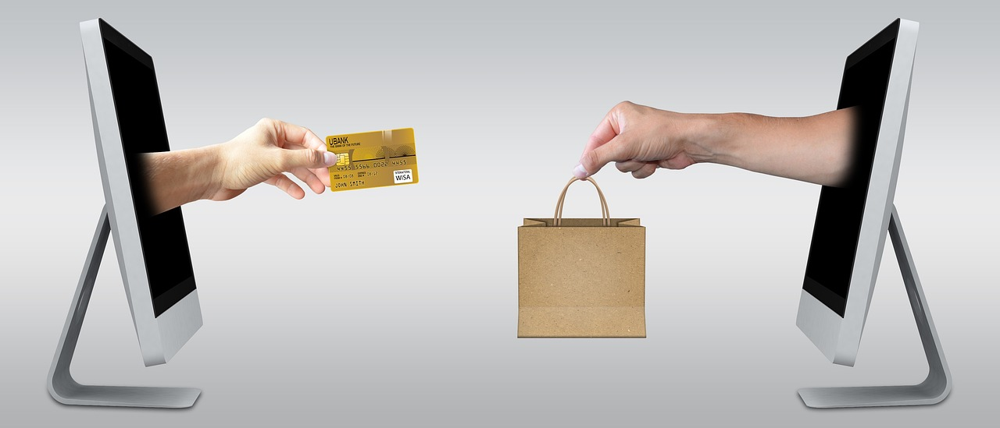

# Introducción <a class="tocSkip">

<div class=text-justify>
En el presente proyecto se analizan datos de una empresa minorista que realiza sus ventas online. Para esta tarea se va a suponer que el Director General solicita un análisis de los clientes porque quiere conocer de cada uno la probabilidad que tiene de abandonar la marca, en otras palabras, quiere retener a los clientes cuyo riesgo de fuga es alto y lanzarles promociones especiales sólo a ese grupo de alto riesgo, ya que resulta menos caro invertir para retener a los clientes que invertir para atraer nuevos clientes. Por lo anterior, se va a diseñar un modelo de scoring de riesgo que pronostique la probabilidad de abandono.
</div>

El proyecto consta de las siguientes etapas:

1. Set up
2. Carga de datos
3. Panorama general a los datos
4. Análisis exploratorio
5. Separación del conjunto de datos
6. Tratamiento de valores atípicos
7. Tratamiento de valores faltantes
8. Recodificación de variables
9. Codificación de variables
10. Creación de modelos
11. Importancia de las variables
12. Punto de corte (visión de negocio)
13. Interpretabilidad del modelo
14. Evaluación final
15. Resultados (entregable)

El conjunto de datos pertenece a una empresa líder en comercio electrónico en línea. Una empresa minorista en línea (comercio electrónico) quiere conocer a los clientes que van a abandonar, por lo que pueden acercarse al cliente para ofrecerles algunas promociones.

Descripción de las variables:

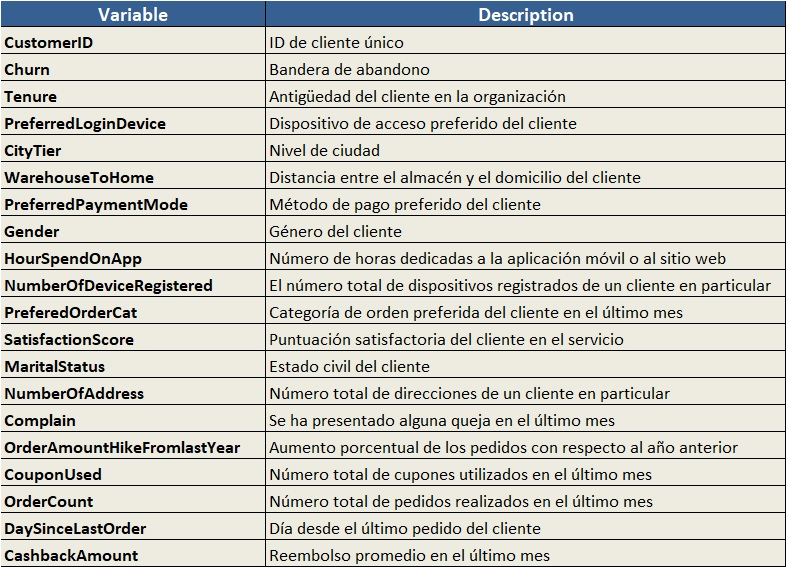

# Set up

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

import warnings

warnings.filterwarnings(action = 'ignore')

import re
from scipy.stats import chi2_contingency
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from feature_engine import outliers as outr
from feature_engine.imputation import RandomSampleImputer
from feature_engine.encoding import RareLabelEncoder
from feature_engine.discretisation import EqualFrequencyDiscretiser
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from xgboost import plot_importance
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
import scikitplot as skplt
from sklearn.metrics import precision_recall_curve
from sklearn.inspection import permutation_importance
from yellowbrick.classifier import DiscriminationThreshold
import optuna

%matplotlib inline
sns.set_theme(color_codes=True)
plt.style.use('ggplot')
pd.options.display.min_rows = 6
pd.options.display.max_columns = None

# Carga de datos

Se importan los datos.

In [2]:
df = pd.read_excel('data/E Commerce Dataset.xlsx', sheet_name = 'E Comm')
df.head()

,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.90
1,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.28
2,50012,1,11.0,Mobile Phone,1,6.0,Debit Card,Male,3.0,4,Fashion,3,Single,10,1,13.0,0.0,1.0,0.0,153.81
3,50019,1,0.0,Computer,1,13.0,Debit Card,Male,3.0,5,Laptop & Accessory,3,Single,2,1,24.0,1.0,1.0,6.0,160.74
4,50026,1,0.0,Phone,1,15.0,Credit Card,Female,2.0,3,Mobile Phone,5,Single,8,0,22.0,1.0,1.0,4.0,142.00


# Panorama general

En esta primer parte solo se van a revisar las dimensiones del dataset así como sus tipos y las cardinalidades de las variables no numméricas. Para las variables veremos los estadísticos básicos.

In [3]:
print("Total de filas: {}".format(df.shape[0]))
print("Total de variables: {}".format(df.shape[1]))

Total de filas: 5630
Total de variables: 20


In [4]:
df.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5366 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5379 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5375 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

Tenemos 5 variables no numéricas o categóricas y 15 variables numéricas. Ademas, existen algunas variables con observaciones faltantes, las cuales se trataran más delante.

Valores únicos

In [5]:
df.select_dtypes(exclude = 'object').nunique().sort_values()

Churn                             2
Complain                          2
CityTier                          3
SatisfactionScore                 5
HourSpendOnApp                    6
NumberOfDeviceRegistered          6
NumberOfAddress                  15
OrderAmountHikeFromlastYear      16
OrderCount                       16
CouponUsed                       17
DaySinceLastOrder                22
WarehouseToHome                  34
Tenure                           36
CashbackAmount                 2586
CustomerID                     5630
dtype: int64

In [6]:
df.select_dtypes('object').nunique()

PreferredLoginDevice    3
PreferredPaymentMode    7
Gender                  2
PreferedOrderCat        6
MaritalStatus           3
dtype: int64

Conozcamos las variables no numéricas y sus cardinaledades.

In [7]:
for col in df.select_dtypes(include = ['object']).columns:
    
    print(f"{col}: {df[col].unique()}")

PreferredLoginDevice: ['Phone' 'Mobile Phone' 'Computer']
PreferredPaymentMode: ['UPI' 'Debit Card' 'Credit Card' 'CC' 'COD' 'E wallet' 'Cash on Delivery']
Gender: ['Male' 'Female']
PreferedOrderCat: ['Mobile' 'Fashion' 'Laptop & Accessory' 'Mobile Phone' 'Others' 'Grocery']
MaritalStatus: ['Single' 'Married' 'Divorced']


Estadísticos básicos de las variables numéricas

In [8]:
df.select_dtypes(exclude = 'object').describe(percentiles = list(np.arange(0.1, 1, 0.1))).T

,count,mean,std,min,10%,20%,30%,40%,50%,60%,70%,80%,90%,max
CustomerID,5630.0,52815.500000,1625.385339,50001.0,50563.90,51126.800,51689.700,52252.600,52815.50,53378.400,53941.30,54504.200,55067.10,55630.00
Churn,5630.0,0.168384,0.374240,0.0,0.00,0.000,0.000,0.000,0.00,0.000,0.00,0.000,1.00,1.00
Tenure,5366.0,10.189899,8.557241,0.0,1.00,1.000,4.000,6.000,9.00,11.000,14.00,18.000,23.00,61.00
CityTier,5630.0,1.654707,0.915389,1.0,1.00,1.000,1.000,1.000,1.00,1.000,3.00,3.000,3.00,3.00
WarehouseToHome,5379.0,15.639896,8.531475,5.0,7.00,8.000,9.000,11.000,14.00,15.000,17.00,23.000,30.00,127.00
HourSpendOnApp,5375.0,2.931535,0.721926,0.0,2.00,2.000,3.000,3.000,3.00,3.000,3.00,4.000,4.00,5.00
NumberOfDeviceRegistered,5630.0,3.688988,1.023999,1.0,3.00,3.000,3.000,4.000,4.00,4.000,4.00,4.000,5.00,6.00
SatisfactionScore,5630.0,3.066785,1.380194,1.0,1.00,1.000,2.000,3.000,3.00,3.000,4.00,4.000,5.00,5.00
NumberOfAddress,5630.0,4.214032,2.583586,1.0,2.00,2.000,2.000,3.000,3.00,4.000,5.00,6.000,8.00,22.00
Complain,5630.0,0.284902,0.451408,0.0,0.00,0.000,0.000,0.000,0.00,0.000,0.00,1.000,1.00,1.00


# EDA

Antes de todo se hace una copia de respaldo para usarse hasta el final con el objetivo de identificar los ids de los clientes de alto riesgo.

In [9]:
df_respaldo = df[['CustomerID']].copy().reset_index()

En esta parte del proyecto se realizará el análisis exploratorio de datos. Hay una variable que es el identificador del cliente, la cual se va a eliminar ya que para los fines del presente trabajo no aporta utilidad, ya que cada registro es unico.

In [10]:
df.CustomerID.nunique()

5630

In [11]:
df.drop(columns = 'CustomerID', inplace = True)

Veamos si existen registros duplicados

In [12]:
df.duplicated().sum()

556

Se tienen 556 registros duplicados, por lo que, se procede a eliminarlos. Probablemente, corresponden a clientes diferentes pero al tener los mismos datos en todas las variables no aportan patrones o información diferente en los datos.

In [13]:
df.drop_duplicates(inplace = True)
df.duplicated().sum()

0

Vamos a corregir los tipos de datos de las variables para evitar posibles problemas a la hora de hacer los análisis visuales y para optimizar el uso de memoria.

Recordando que los tipos numéricos incorrectos pueden no generar problemas a la hora de hacer cálculos, sin embargo, ocuparán demasiado espacio en la memoria del ordenador lo que afectará el rendimiento si la base a manejar es muy grande. Aquí está un resumen de los tipos y sus medidas.

`int8`: **byte (-128 to 127)**

`int16`: **integer (-32768 to 32767)**

`int32`: **integer (-2147483648 to 2147483647)**

`int64`: **integer (-9223372036854775808 to 9223372036854775807-32768 to 32767)**


`float16`: **float (-65500.0 to 65500.0)**

`float32`: **float (-3.4028235e+38 to 3.4028235e+38)**

In [14]:
def reduce_memory_usage(df):
    for col in df.columns:
        
        col_type = df[col].dtype
        
        if col_type != 'object':
            
            c_min = df[col].min()
            c_max = df[col].max()
            
            if str(col_type)[:3] == 'int':
                
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
            else:
                
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                
                else:
                    
                    pass
        else:
            
            df[col] = df[col].astype('category')
    
    return df.dtypes

In [15]:
reduce_memory_usage(df)

Churn                              int8
Tenure                          float16
PreferredLoginDevice           category
CityTier                           int8
WarehouseToHome                 float16
PreferredPaymentMode           category
Gender                         category
HourSpendOnApp                  float16
NumberOfDeviceRegistered           int8
PreferedOrderCat               category
SatisfactionScore                  int8
MaritalStatus                  category
NumberOfAddress                    int8
Complain                           int8
OrderAmountHikeFromlastYear     float16
CouponUsed                      float16
OrderCount                      float16
DaySinceLastOrder               float16
CashbackAmount                  float16
dtype: object

Para facilitar los análisis visuales se divide la base en dos partes: una para las variables no numéricas y otra para variables numéricas.

In [16]:
df_cat = df.select_dtypes("category").copy()
df_cat

,PreferredLoginDevice,PreferredPaymentMode,Gender,PreferedOrderCat,MaritalStatus
0,Phone,UPI,Male,Mobile,Single
1,Phone,Debit Card,Male,Mobile,Single
2,Mobile Phone,Debit Card,Male,Fashion,Single
...,...,...,...,...,...
5627,Mobile Phone,Credit Card,Male,Fashion,Married
5628,Mobile Phone,Debit Card,Male,Laptop & Accessory,Married
5629,Mobile Phone,Credit Card,Male,Laptop & Accessory,Married


In [17]:
df_num = df.select_dtypes(exclude = 'category').copy()
df_num

,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,NaN,1,8.0,3.0,4,3,7,1,15.0,0.0,1.0,0.0,120.875
1,1,NaN,1,30.0,2.0,4,3,6,1,14.0,0.0,1.0,3.0,120.250
2,1,11.0,1,6.0,3.0,4,3,10,1,13.0,0.0,1.0,0.0,153.750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5627,0,13.0,1,13.0,3.0,5,5,6,0,16.0,1.0,2.0,NaN,224.875
5628,0,1.0,1,11.0,3.0,2,4,3,1,21.0,1.0,2.0,4.0,186.375
5629,0,8.0,1,15.0,3.0,2,3,4,0,13.0,2.0,2.0,3.0,169.000


## Análisis univariante

<div class=text-justify>
Se empieza con el análisis visual a las variables que se consideran continuas y si se sospecha de la presencia de valores atípicos se continuará con gráficos de boxplot junto con tablas de frecuencia para ver los valores  mínimos y máximos, en otras palabras, se hará un recuento por la izquierda y por la derecha para tener mayor visibilidad de los datos a los extremos de cada variable. Recordar que los gráficos ayudan a ver cómo es la forma de la distribución, pero es difícil saber qué observaciones pueden estar sesgando la misma.
</div>

### Variables numéricas (parte 1)

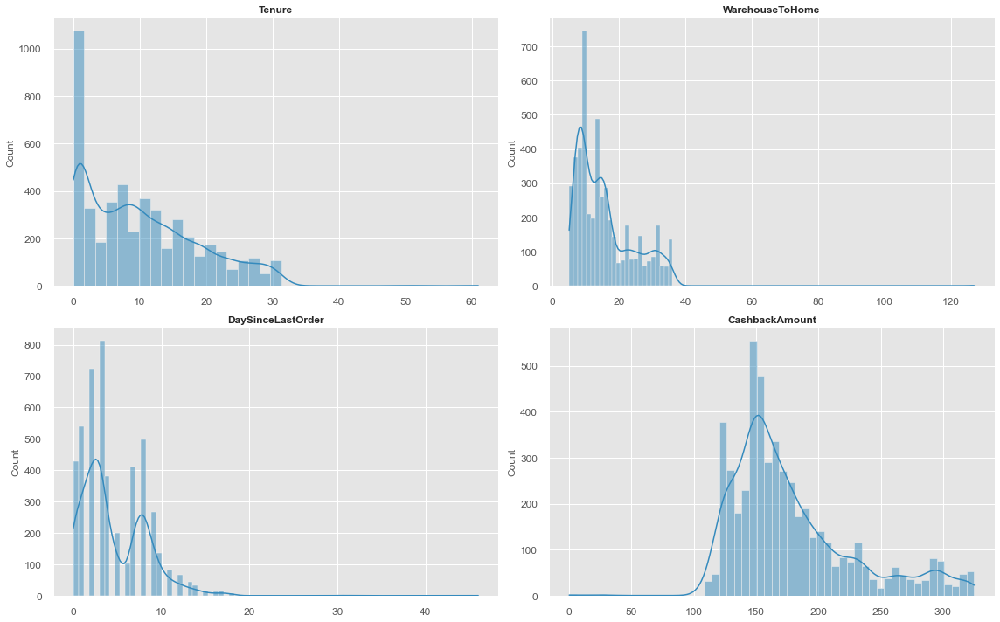

In [18]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (16, 10))

ax = ax.flat

for i, col in enumerate(df_num[['Tenure','WarehouseToHome','DaySinceLastOrder','CashbackAmount']].columns):
    sns.histplot(data = df_num, x = col, ax = ax[i], kde = True)
    ax[i].set_title(col, fontsize = 12, fontweight = 'bold')
    ax[i].tick_params(labelsize = 12)
    ax[i].set_xlabel('')

f.tight_layout()

Estas variables, parece que tienen valores atípicos porque sus respectivas distribuciones están muy sesgadas. Veamos ahora los boxplots para confirmarlo.

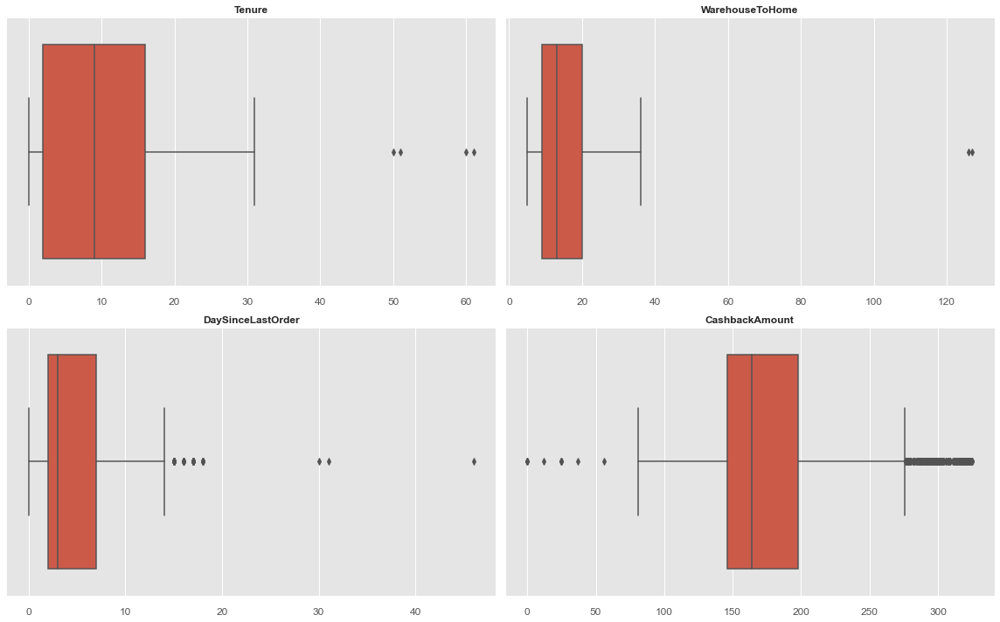

In [19]:
f, ax = plt.subplots(nrows = 2, ncols = 2, figsize = (16, 10))

ax = ax.flat

for i, col in enumerate(df_num[['Tenure','WarehouseToHome','DaySinceLastOrder','CashbackAmount']].columns):
    sns.boxplot(data = df_num, x = col, ax = ax[i])
    ax[i].set_title(col, fontsize = 12, fontweight = 'bold')
    ax[i].tick_params(labelsize = 12)
    ax[i].set_xlabel('')

f.tight_layout()

Con ayuda de los boxplots se aprecia más claramente que en estas cuatro variables hay presencia de valores extremos que sesgan las distribuciones. Veamos sus tablas de frecuencias para ver que está pasando con esos valores y darnos una primer idea de que cómo tratarlas.

**Tenure**

Valores máximos

In [20]:
df_num.groupby('Tenure', as_index = False) \
    .size().sort_values(by = 'Tenure').tail(10) \
    .style.highlight_min(subset = ['size'], color = '#ff781c')

,Tenure,size
26,26.000000,56
27,27.000000,59
28,28.000000,61
29,29.000000,52
30,30.000000,63
31,31.000000,46
32,50.000000,1
33,51.000000,1
34,60.000000,1
35,61.000000,1


Valores mínimos

In [21]:
df_num.groupby('Tenure', as_index = False) \
    .size().sort_values(by = 'Tenure').head(10) \
    .style.highlight_between(subset = ['size'], color = '#ff781c', left = 400, right = 700)

,Tenure,size
0,0.000000,457
1,1.000000,619
2,2.000000,152
3,3.000000,176
4,4.000000,185
5,5.000000,189
6,6.000000,166
7,7.000000,195
8,8.000000,233
9,9.000000,228


Conclusiones: se confirma que hay 4 observaciones atípicas en la parte derecha de la distribución. Por la parte derecha no hay presencia de atípicos solo que en los dos primeros valores se concentra el mayor número de observaciones.

**WarehouseToHome**

Valores máximos

In [22]:
df_num.groupby('WarehouseToHome', as_index = False) \
    .size().sort_values(by = 'WarehouseToHome').tail(10) \
    .style.highlight_min(subset = ['size'], color = '#ff781c')

,WarehouseToHome,size
24,29.000000,71
25,30.000000,84
26,31.000000,90
27,32.000000,87
28,33.000000,60
29,34.000000,57
30,35.000000,87
31,36.000000,48
32,126.000000,1
33,127.000000,1


Valores mínimos

In [23]:
df_num.groupby('WarehouseToHome', as_index = False) \
    .size().sort_values(by = 'WarehouseToHome').head(10) \
    .style.highlight_min(subset = ['size'], color = '#ff781c')

,WarehouseToHome,size
0,5.000000,8
1,6.000000,283
2,7.000000,376
3,8.000000,404
4,9.000000,506
5,10.000000,240
6,11.000000,209
7,12.000000,196
8,13.000000,220
9,14.000000,267


Conclusiones: Se confirma que hay 2 valores atípicos por la parte derecha de la distribución. En la parte izquierda no hay outliers, solo que el primer grupo concentra muy pocas observaciones.

**DaySinceLastOrder**

Valores máximos

In [24]:
df_num.groupby('DaySinceLastOrder', as_index = False) \
    .size().sort_values(by = 'DaySinceLastOrder').tail(10) \
    .style.highlight_between(subset = ['size'], left = 1, right = 20, color = '#ff781c')

,DaySinceLastOrder,size
12,12.000000,65
13,13.000000,44
14,14.000000,32
15,15.000000,17
16,16.000000,12
17,17.000000,16
18,18.000000,9
19,30.000000,1
20,31.000000,1
21,46.000000,1


Valores mínimos

In [25]:
df_num.groupby('DaySinceLastOrder', as_index = False) \
    .size().sort_values(by = 'DaySinceLastOrder').head(10) \
    .style.highlight_between(subset = ['size'], color = '#ff781c', left = 500, right = 900)

,DaySinceLastOrder,size
0,0.000000,428
1,1.000000,541
2,2.000000,723
3,3.000000,814
4,4.000000,381
5,5.000000,199
6,6.000000,102
7,7.000000,413
8,8.000000,498
9,9.000000,268


Conclusiones: existen 57 valores atípicos en esta variable por el lado derecho de su distribución. Por el lado izquierdo no parece haber valores extremos, sin embargo, presenta una distribución bimodal, por la frecuencia que tienen algunos grupos.

**CashbackAmount**

Valores máximos

In [26]:
CashbackAmount_Q1 = df_num['CashbackAmount'].quantile(0.25)
CashbackAmount_Q3 = df_num['CashbackAmount'].quantile(0.75)
CashbackAmount_IQR = CashbackAmount_Q3 - CashbackAmount_Q1

df_num.loc[df_num['CashbackAmount'] > (CashbackAmount_Q3 + CashbackAmount_IQR * 1.5), :] \
    .groupby('CashbackAmount', as_index = False).size() \
    .sort_values(by = 'CashbackAmount')

,CashbackAmount,size
0,276.50,4
1,276.75,2
2,277.00,1
...,...,...
118,324.50,2
119,324.75,2
120,325.00,2


valores mínimos

In [27]:
df_num.loc[df_num['CashbackAmount'] < (CashbackAmount_Q1 - CashbackAmount_IQR * 1.5), :] \
    .groupby('CashbackAmount', as_index = False).size() \
    .style.highlight_between(subset = ['CashbackAmount'], color = '#ff781c', left = 0, right = 60)

,CashbackAmount,size
0,0.000000,4
1,12.000000,1
2,25.000000,4
3,37.000000,1
4,56.000000,1


<div class=text-justify>
Conclusiones: En esta varable hay 11 valores atípicos al lado izquierdo de la distribución. Al aldo derecho al parecer, por su forma, hay 121 valores clasificados como atípicos. Si embargo, hay que recordar que estas primeras variables no son normales, por lo que, la forma de detectar estos valores no es la adecuada, pero al menos ya se tiene un primer vistazo de sus observaciones.
</div>

### Variables numéricas (parte 2)

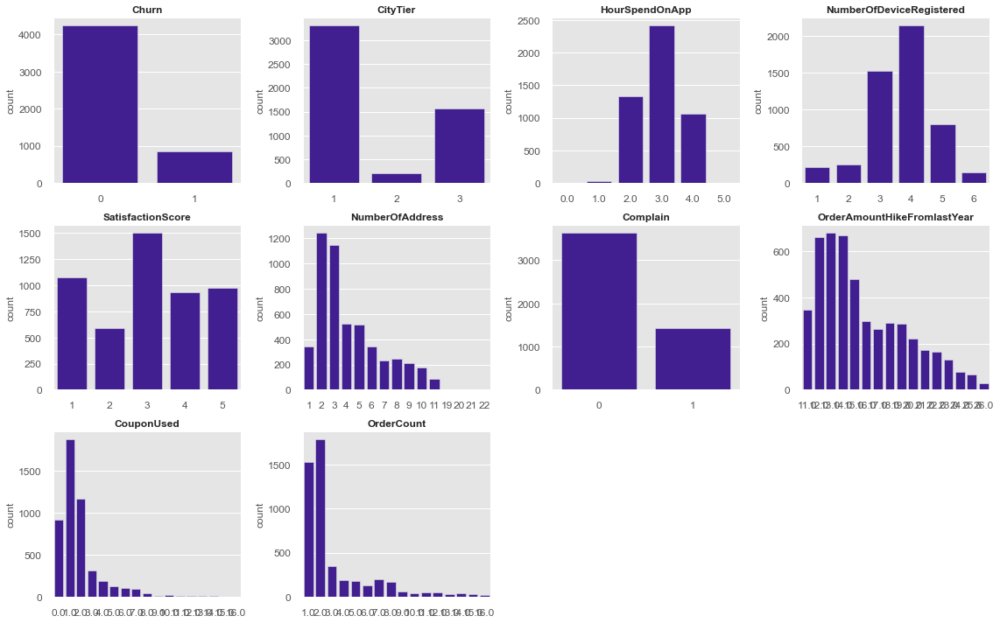

In [28]:
f, ax = plt.subplots(nrows = 3, ncols = 4, figsize = (16, 10))

ax = ax.flat

for i, col in enumerate(df_num.drop(columns = ['Tenure','WarehouseToHome','DaySinceLastOrder','CashbackAmount']).columns):
    sns.countplot(data = df_num, x = col, ax = ax[i], color = '#3A0CA3')
    ax[i].set_title(col, fontsize = 12, fontweight = 'bold')
    ax[i].tick_params(labelsize = 12)
    ax[i].set_xlabel('')

f.tight_layout()
f.delaxes(ax[10])
f.delaxes(ax[11])

De las gráficas anteriores, solo las variables *NumberOfAddress*, *CouponUsed* y *OrderCount* presentan valores atípicos a la derecha de sus respectivas distribuciones. La variable *HourSpendOnApp* presenta pocas observaciones a los extremos de su distribución.

**CityTier**

In [29]:
df_num.groupby('CityTier', as_index = False).size()

,CityTier,size
0,1,3306
1,2,195
2,3,1573


**HourSpendOnApp**

In [30]:
df_num.groupby('HourSpendOnApp', as_index = False).size() \
    .style.highlight_between(subset = ['size'], color = '#ff781c', left = 3, right = 33)

,HourSpendOnApp,size
0,0.000000,3
1,1.000000,33
2,2.000000,1332
3,3.000000,2415
4,4.000000,1058
5,5.000000,3


Conclusiones: en esta variable numérica, se presentan pocas observaciones (solo 3) a los extremos de su distribución, en el primer y último grupo.

**NumberOfAddress**

In [31]:
df_num.groupby('NumberOfAddress', as_index = False).size() \
    .tail(10).style.highlight_min(subset = ['size'], color = '#ff781c')

,NumberOfAddress,size
5,6,345
6,7,234
7,8,249
8,9,212
9,10,173
10,11,84
11,19,1
12,20,1
13,21,1
14,22,1


Conclusiones: En esta variable hay 4 observaciones que se pueden considerar atípicas ya que solo hay 1 solo caso en cada grupo.

**OrderAmountHikeFromlastYear**

In [32]:
df_num.groupby('OrderAmountHikeFromlastYear', as_index = False).size() \
    .tail(10).style.highlight_min(subset = ['size'], color = '#ff781c')

,OrderAmountHikeFromlastYear,size
6,17.000000,262
7,18.000000,291
8,19.000000,284
9,20.000000,220
10,21.000000,171
11,22.000000,164
12,23.000000,130
13,24.000000,77
14,25.000000,67
15,26.000000,29


Conclusiones: Para esta variable hay tres niveles por debajo de las 100 observaciones.

**CouponUsed**

In [33]:
df_num.groupby('CouponUsed', as_index = False).size() \
    .tail(10).style.highlight_between(subset = ['CouponUsed'], color = '#ff781c', left = 12, right = 16)

,CouponUsed,size
7,7.000000,88
8,8.000000,42
9,9.000000,13
10,10.000000,14
11,11.000000,12
12,12.000000,9
13,13.000000,8
14,14.000000,4
15,15.000000,1
16,16.000000,2


Conclusiones: En la variable CouponUsed hay muy pocas observaciones que caen en los últimos grupos, lo que provoca que su distribución esté sesgada a la derecha.

**OrderCount**

In [34]:
df_num.groupby('OrderCount', as_index = False).size() \
    .tail(10).style.highlight_between(subset = ['OrderCount'], color = '#ff781c', left = 9, right = 16)

,OrderCount,size
6,7.000000,197
7,8.000000,166
8,9.000000,60
9,10.000000,35
10,11.000000,50
11,12.000000,51
12,13.000000,29
13,14.000000,33
14,15.000000,30
15,16.000000,22


Conclusiones: esta variable también presenta pocas observaciones al lado derecho de su distribución lo que genera asimetría positiva.

<div class=text-justify>
En este análisis univariante numérico, hay ocho variables con observaciones atípicas, de las cuales la columna CashbackAmount es la que más valores tiene. Más adelante veremos qué hacer con este tipo de datos, si se eliminan, se sustituyen o discretizan, todo dependerá del analisis conjunto, porque en lo individual pueden parecer observaciones atípicas pero junto con otras variables tal vez no lo sean o viceversa, valores que en lo individual no sean valores atípicos pero junto con otra variable aparezcan outliers. También, la variable target <strong>Churn</strong> está desbalanceada, lo cual era de suponer, ya que en este tipo de contextos la cantidad de casos donde el cliente abandona son los menos. También, será tratado este problema más adelante.
</div>

### Variables categóricas

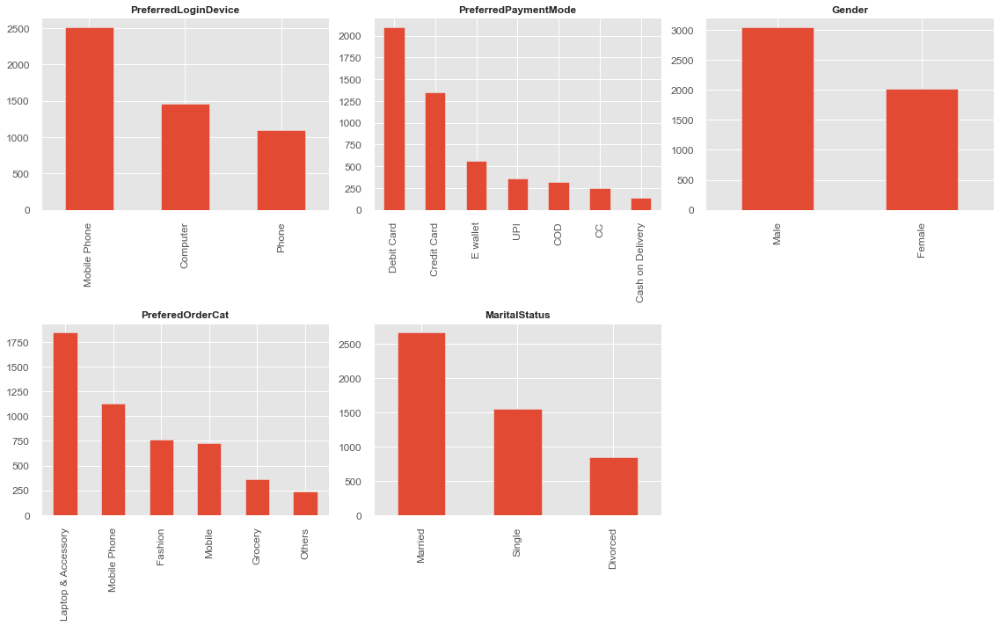

In [35]:
f, ax = plt.subplots(nrows = 2, ncols = 3, figsize = (16, 10))

ax = ax.flat

for i, col in enumerate(df_cat.columns):
    df_cat[col].value_counts().plot.bar(ax = ax[i])
    ax[i].set_title(col, fontsize = 12, fontweight = 'bold')
    ax[i].tick_params(labelsize = 12)

f.tight_layout()
f.delaxes(ax[5])

En estas gráficas se aprecia que no hay nada raro en las variables categóricas, tal vez en la variable *PreferredPaymentMode* se puedan agrupar las categorías con pocas observaciones para que no generen problemas más adelante cuando se entrene el modelo.

In [36]:
def freq_raras(df):
    resultado = df.apply(lambda x: x.value_counts(normalize = True)).T.stack() \
                .to_frame().reset_index() \
                .rename(columns = {'level_0':'Variable', 'level_1':'Valor', 0:'Frecuencia'}) \
                .sort_values(by = ['Variable','Frecuencia'])
    return (resultado)

In [37]:
freq_raras(df_cat)

,Variable,Valor,Frecuencia
10,Gender,Female,0.399291
11,Gender,Male,0.600709
18,MaritalStatus,Divorced,0.167127
20,MaritalStatus,Single,0.306070
19,MaritalStatus,Married,0.526803
17,PreferedOrderCat,Others,0.047694
13,PreferedOrderCat,Grocery,0.072132
15,PreferedOrderCat,Mobile,0.143082
12,PreferedOrderCat,Fashion,0.150374
16,PreferedOrderCat,Mobile Phone,0.222704


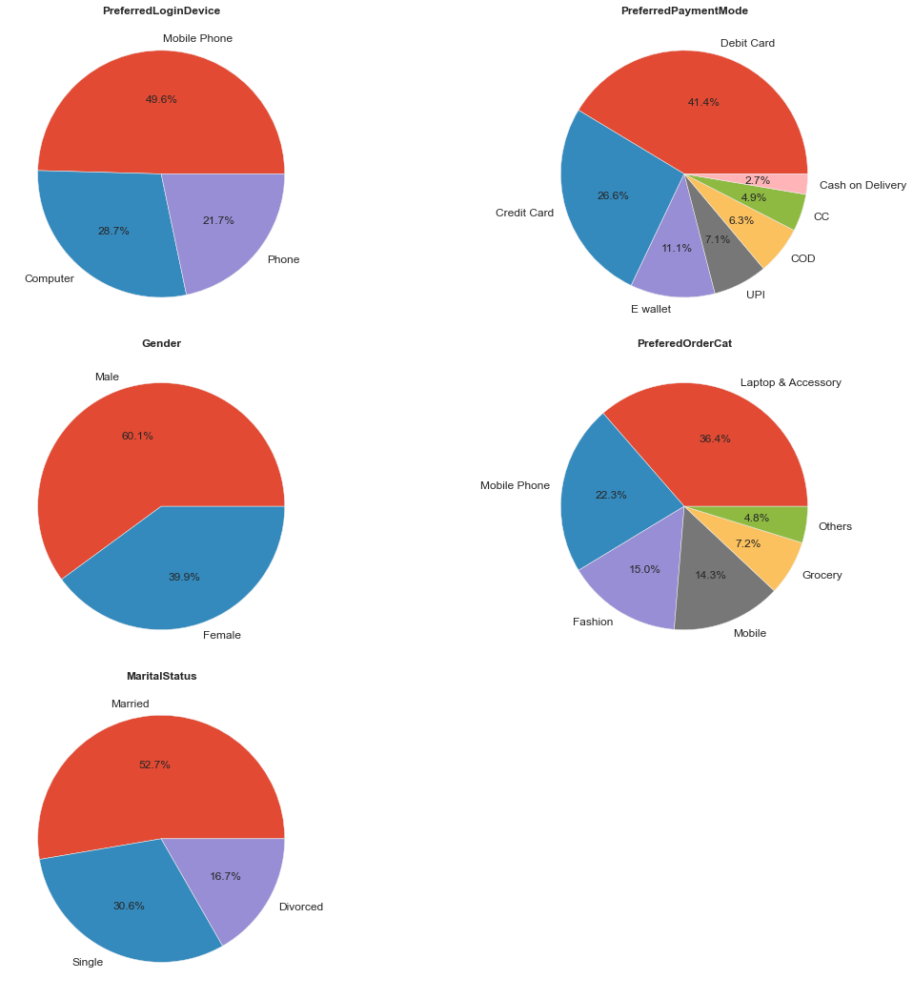

In [38]:
f, ax = plt.subplots(nrows = 3, ncols = 2, figsize = (16, 15))

ax = ax.flat

for i, col in enumerate(df_cat.columns):
    ax[i].pie(df_cat[col].value_counts(), labels = df_cat[col].value_counts().index,
              autopct = '%1.1f%%', textprops = {'fontsize':12})
    ax[i].set_title(col, fontsize = 12, fontweight = 'bold')
    ax[i].tick_params(labelsize = 18)

f.tight_layout()
f.delaxes(ax[5])

Las variables categóricas al parecer no presentan valores atípicos, o sea, cardinalidades muy bajas (pocas etiquetas o categorías) o muy altas.

In [39]:
df_cat.nunique()

PreferredLoginDevice    3
PreferredPaymentMode    7
Gender                  2
PreferedOrderCat        6
MaritalStatus           3
dtype: int64

## Análisis multivariante

Hasta aquí se ha hecho el análisis variable por variable, sin embargo, para tener una visión más completa se debe hacer este mismo ejercicio pero incorporando la variable target con el propósito de identificar las posibles variables predictoras.

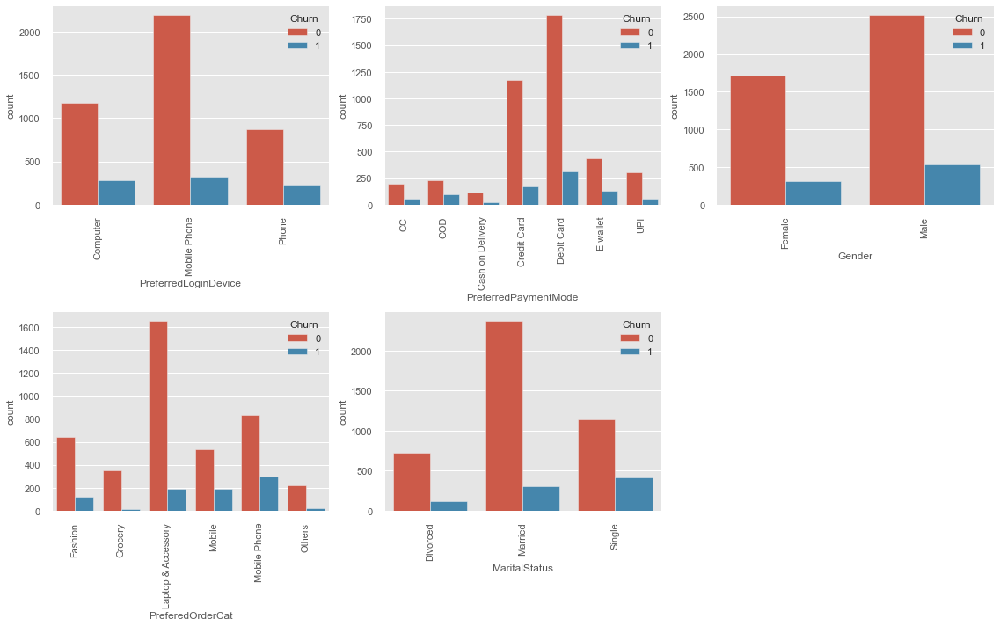

In [40]:
f, ax = plt.subplots(nrows = 2, ncols = 3, figsize = (16, 10))
ax = ax.flatten()

for i, col in enumerate(df_cat.columns):
    sns.countplot(x = col, hue = 'Churn', data = df, ax = ax[i])
    ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation = 90)
    
f.tight_layout()
f.delaxes(ax[5])

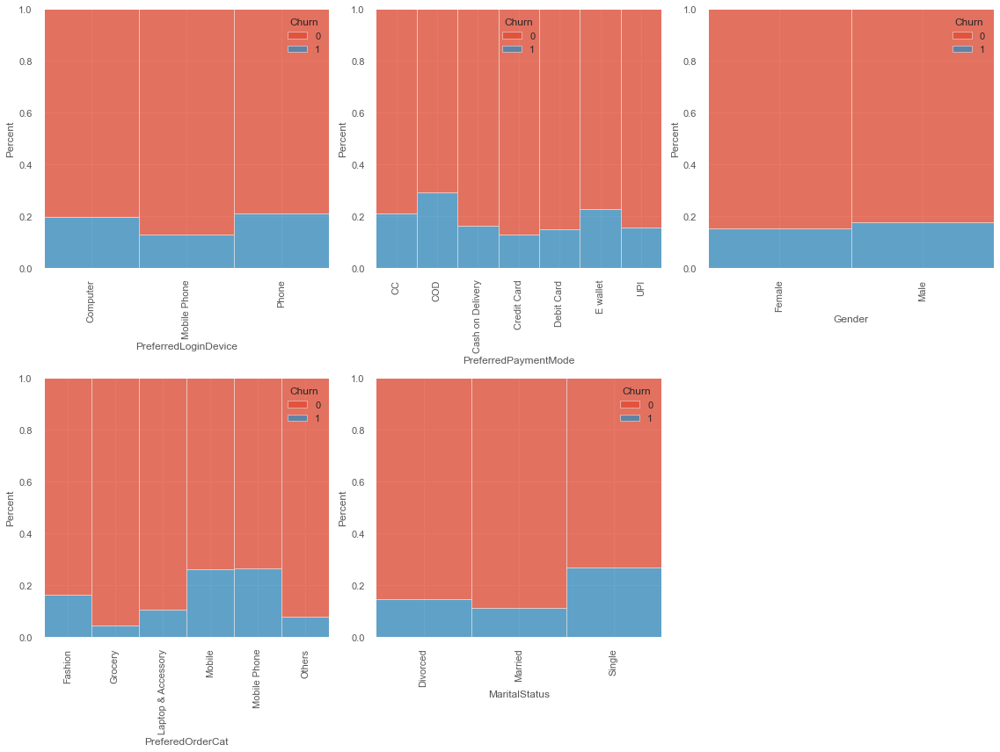

In [41]:
import warnings
warnings.filterwarnings("ignore")

f, ax = plt.subplots(nrows = 2, ncols = 3, figsize = (16, 12))
ax = ax.flatten()

for i, col in enumerate(df_cat.columns.values):
    sns.histplot(x = col, hue = 'Churn', data = df, ax = ax[i],
                 multiple = "fill", kde = False, element = "bars",
                 fill = True, stat = 'percent')
    ax[i].set_xticklabels(df[col].cat.categories, rotation = 90)
    
f.tight_layout()
f.delaxes(ax[5])

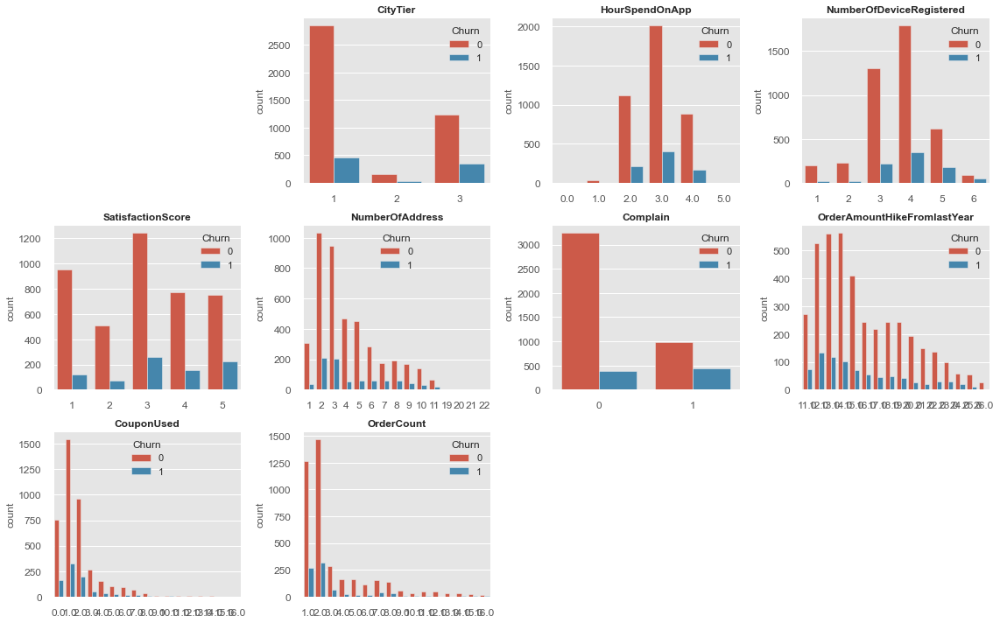

In [42]:
f, ax = plt.subplots(nrows = 3, ncols = 4, figsize = (16, 10))

ax = ax.flat

for i, col in enumerate(df_num.drop(columns = ['Tenure','WarehouseToHome','DaySinceLastOrder','CashbackAmount']).columns):
    sns.countplot(data = df_num, x = col, ax = ax[i], hue = 'Churn')
    ax[i].set_title(col, fontsize = 12, fontweight = 'bold')
    ax[i].tick_params(labelsize = 12)
    ax[i].set_xlabel('')

f.tight_layout()
f.delaxes(ax[0])
f.delaxes(ax[10])
f.delaxes(ax[11])

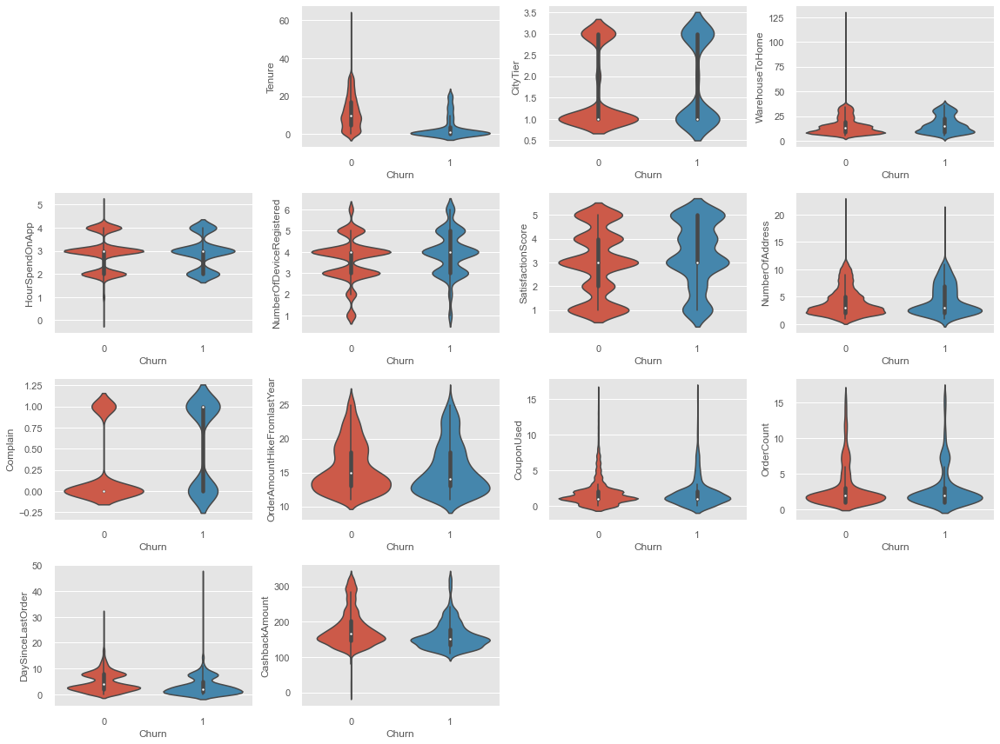

In [43]:
import warnings
warnings.filterwarnings("ignore")

f, ax = plt.subplots(nrows = 4, ncols = 4, figsize = (16, 12))
ax = ax.flat

for i, col in enumerate(df_num.columns.values):
    sns.violinplot(y = col, x = 'Churn', data = df, ax = ax[i])
    
f.tight_layout()
f.delaxes(ax[0])
f.delaxes(ax[14])
f.delaxes(ax[15])

<div class=text-justify>
Para graficar diagramas de dispersión, vamos a generar una tabla que muestre las correlaciones lineales, en absoluto, más fuertes y sobre esas variables se hará el análisis gráfico. Hay que recordar que esto se hace solo con fines de facilitar la visualización de las correlaciones, ya que la matriz de correlaciones mediante un heatmap es algo complicado de ver. Además, este ejercicio sólo muestra las relaciones lineales entre las variables numéricas.
</div>

In [44]:
def correlaciones_fuertes(df, lim_inf = 0.3, lim_sup = 1, drop_dup = True):
    c = df.corr().abs()
    c = c.unstack()
    c = pd.DataFrame(c).reset_index()
    c.columns = ['var1', 'var2', 'corr']
    c = c.loc[(c['corr'] > lim_inf) & (c['corr'] < lim_sup), :].sort_values(by = 'corr', ascending = False)
    c = c if drop_dup == False else c.drop_duplicates(subset = ['corr'])
    return (c)

In [45]:
corrs = correlaciones_fuertes(df_num)
corrs

,var1,var2,corr
151,CouponUsed,OrderCount,0.742021
166,OrderCount,DaySinceLastOrder,0.506459
27,Tenure,CashbackAmount,0.476219
152,CouponUsed,DaySinceLastOrder,0.362887
167,OrderCount,CashbackAmount,0.353038
181,DaySinceLastOrder,CashbackAmount,0.348240
1,Churn,Tenure,0.342394
61,HourSpendOnApp,NumberOfDeviceRegistered,0.308733


La tabla muestra las correlaciones mayores a 0.3, en valor absoluto. Ya con esta información podemos saber y hacer las gráficas de dispersión.

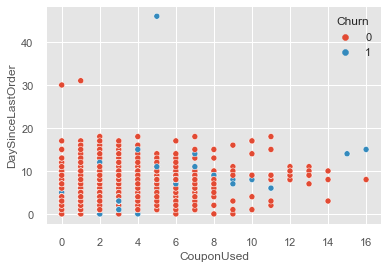

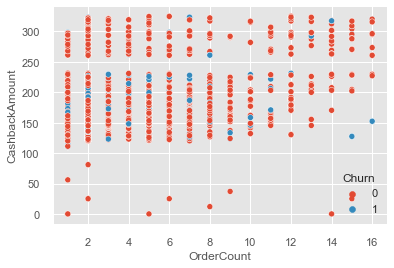

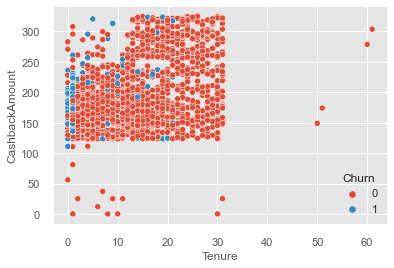

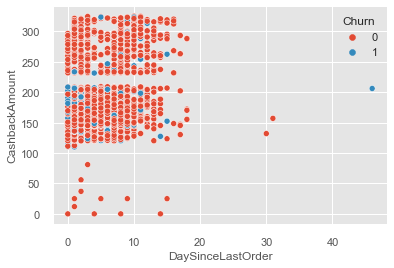

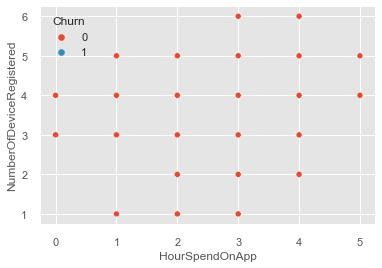

In [46]:
vars1 = list(corrs.var1.values)
vars2 = list(corrs.var2.values)
dic_vars = dict(zip(vars1, vars2))
del dic_vars['Churn']

#f, ax = plt.subplots(nrows = 2, ncols = 4, figsize = (16, 12))
#ax = ax.flat

for col1, col2 in dic_vars.items():
    sns.scatterplot(x = df[col1], y = df[col2], data = df, hue = 'Churn', legend = True)
    plt.show()

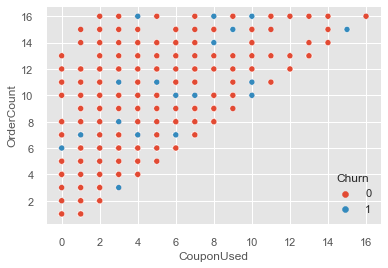

In [47]:
sns.scatterplot(x = df['CouponUsed'], y = df['OrderCount'], data = df, hue = 'Churn', legend = True);

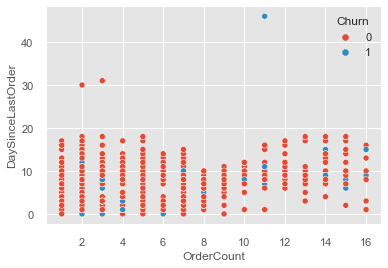

In [48]:
 sns.scatterplot(x = df['OrderCount'], y = df['DaySinceLastOrder'], data = df, hue = 'Churn', legend = True);

## Diagnóstico valores atípicos (outliers)

<div class=text-justify>
Es el momento de identificar si en el dataset existen valores atípicos mejor conocidos como <i>outliers</i>, ya que suelen ser un problema porque distorsionan los análisis estadísticos. Como la base de datos tiene más de una variable se tiene que hacer un análisis multivariante para detección correcta de outliers, ya que no es correcto analizar variable por variable, porque, como se mencionó anteriormente, a nivel individual puede no haber valores atípicos, pero al analizarlas en su conjunto ahí suelen aparecer.
</div>

<div class=text-justify>
Ahora, es importante aclarar desde ahora que los algoritmos a usar para la creación del modelo final serán de la familia de los árboles de decisión, asi que no es tan necesario tratar los outliers, ya que estos algoritmos no se ven afectados por la presencia de éstos, porque de haber un valor atípico el algoritmo lo clasifica en uno de los cortes creados, ya sea por arriba o por debajo de su umbral. Sin embargo, vimos que hay variables que tienen muy pocas observaciones (incluso 1 sola observación) en un corte o categoría, por lo que, eso sí puede causar problemas a la hora de hacer validación cruzada, pues se podría dar el caso de que en uno de los k-fold no haya observaciones de ese caso en particular. Por lo tanto, sí se identificarán los posibles outliers y se trataran solo las variables que estén en el supuesto anterior.
</div>

Primero, se identifican los posibles valores atípicos y cuántos son.

In [49]:
def find_outlier_rows(df, col, level = 'both'):
    iqr = df[col].quantile(0.75) - df[col].quantile(0.25)
    
    lower_bound = df[col].quantile(0.25) - 1.5 * iqr
    upper_bound = df[col].quantile(0.75) + 1.5 * iqr

    if level == 'lower':
        return df[df[col] < lower_bound]
    elif level == 'upper':
        return df[df[col] > upper_bound]
    else:
        return df[(df[col] > upper_bound) | (df[col] < lower_bound)]

In [50]:
def count_outliers(df):
    #df_numeric = df.select_dtypes(include=['int', 'float'])

    columns = df.columns

    outlier_cols = [col for col in columns if len(find_outlier_rows(df, col)) != 0]
    
    outliers_df = pd.DataFrame(columns = ['outlier_counts', 'outlier_percent'])

    for col in outlier_cols:
        outlier_count = len(find_outlier_rows(df, col))
        all_entries = len(df[col])
        outlier_percent = round(outlier_count * 100 / all_entries, 2)

        outliers_df.loc[col] = [outlier_count, outlier_percent]

    return outliers_df

In [51]:
count_outliers(df_num[['Tenure','WarehouseToHome','DaySinceLastOrder','CashbackAmount']]) \
    .sort_values('outlier_counts', ascending = False)

,outlier_counts,outlier_percent
CashbackAmount,381.0,7.51
DaySinceLastOrder,57.0,1.12
Tenure,4.0,0.08
WarehouseToHome,2.0,0.04


Solo en la variable *CashbackAmount* hay mas del 5% de valores atípicos. En las demás variables la cantidad es mínima.

In [52]:
count_outliers(df_num[['CouponUsed','OrderCount','NumberOfAddress','HourSpendOnApp']]) \
    .sort_values('outlier_counts', ascending = False)

,outlier_counts,outlier_percent
OrderCount,673.0,13.26
CouponUsed,610.0,12.02
HourSpendOnApp,6.0,0.12
NumberOfAddress,4.0,0.08


Las variables *NumberOfAddress* y *HourSpendOnApp* hay muy pocos valores atípicos. Las otras dos variables tienen más del 10% de valores atípicos, sin embargo, son candidatas para discretización.

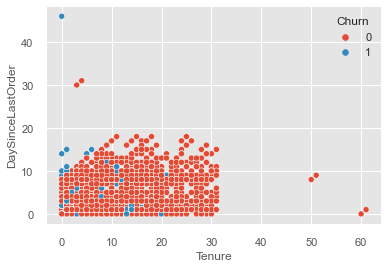

In [53]:
 sns.scatterplot(x = df['Tenure'], y = df['DaySinceLastOrder'], data = df, hue = 'Churn', legend = True);

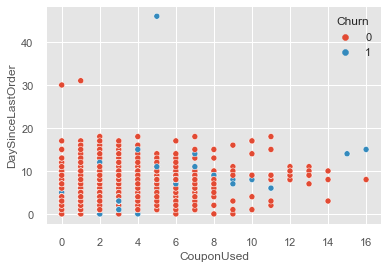

In [54]:
sns.scatterplot(x = df['CouponUsed'], y = df['DaySinceLastOrder'], data = df, hue = 'Churn', legend = True);

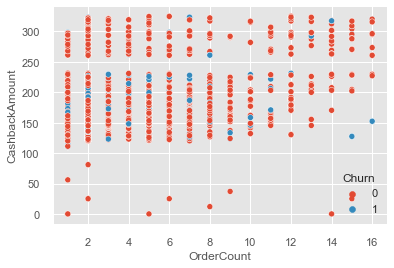

In [55]:
 sns.scatterplot(x = df['OrderCount'], y = df['CashbackAmount'], data = df, hue = 'Churn', legend = True);

Con apoyo de unas funciones se visualizarán los posibles valores atípicos en las variables discretas.

<div class=text-justify>
Se usará el modelo <strong>Gaussian Mixture Model (GMM)</strong>. Aunque no tenemos distribuciones normales es un buen método visual para analizar de dos en dos las variables, el inconveniente es que hay que determinar manualmente el número de valores atípicos que se sospecha que tengan dichas variables. Sin embargo, solo es con fines ilustrativos, ya que como se mencionó al inicio de la sección, los algoritmos a usar no se ven afectados por este tipo de valores.
</div>

In [56]:
def plot_model_gm(data):

    def key_v(lista):
        componentes = []
        for i, v in enumerate(lista):
            comp = int(re.sub(r'[\[\]]', '', str(lista[i])))
            componentes.append(comp)

        return componentes

    def key_b(lista):
        bics = []
        for i, v in enumerate(lista):
            bic = float(re.sub(r'[\[\]]', '', str(lista[i])))
            bics.append(bic)

        return bics


    fig, ax = plt.subplots(figsize = (10, 6))

    n_components = range(1, 5)
    covariance_types = ['spherical','tied','diag','full']
    valores_bic_min = []
    valores_val_min = []

    for covariance_type in covariance_types:

        valores_bic = []

        for i in n_components:
            modelo = GaussianMixture(n_components = i,
                                     covariance_type = covariance_type,
                                     random_state = 123)

            modelo = modelo.fit(data)
            valores_bic.append(modelo.bic(data))

        dict_bic = dict(zip(list(n_components), valores_bic))

        min_bic = min(dict_bic.values())
        min_comp = [k for k, v in dict_bic.items() if v == min_bic]
        min_val = [v for k, v in dict_bic.items() if v == min_bic]

        valores_bic_min.append(min_comp)
        valores_val_min.append(min_val)


        ax.plot(n_components, valores_bic, label = covariance_type)

    list_k = key_v(valores_bic_min)
    list_v = key_b(valores_val_min)

    dict_bic_f = dict(zip(list_k, list_v))

    min_bic = min(dict_bic_f.values())
    componente_min = [k for k, v in dict_bic_f.items() if v == min_bic]
    componente_min = int(re.sub(r'[\[\]]', '', str(componente_min)))

    ax.set_title("Valores BIC (componente minimo: {})".format(componente_min))
    ax.set_xlabel("Número componentes")
    ax.legend();

In [57]:
def plot_anomalies_gm(data, componentes, tipo = 'full', outliers = 30):
    
    import warnings
    warnings.filterwarnings('ignore')
    
    modelo_gmm = GaussianMixture(n_components = componentes,
                                 covariance_type = tipo,
                                 random_state = 123)

    modelo_gmm.fit(X = data)

    log_probabilidad_predicha = modelo_gmm.score_samples(X = data)

    df_resultados = data.copy()
    
    cols = data.columns
    col1 = cols[0]
    col2 = cols[1]
    
    df_resultados['log_proba'] = log_probabilidad_predicha
    df_resultados = df_resultados.sort_values(by = 'log_proba')

    sin_anomalias = df_resultados.reset_index(drop = True)[outliers:].copy()
    sin_anomalias.drop(columns = 'log_proba', inplace = True)
    
    anomalias_X = df_resultados.head(outliers)
    anomalies_xy = anomalias_X.columns
    anomaly_x = anomalies_xy[0]
    anomaly_y = anomalies_xy[1]

    fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (18, 10))

    ### Grid de valores dentro del rango observado
    x = np.linspace(min(data[col1])*0.8, max(data[col1]) * 1.2, 1000)
    y = np.linspace(min(data[col2])*0.8,max(data[col2])*1.2, 1000)
    xx, yy = np.meshgrid(x, y)

    ### Densidad de probabilidad de cada valor del grid
    scores = modelo_gmm.score_samples(np.c_[xx.ravel(), yy.ravel()])
    scores = np.exp(scores)# Los valores están en log

    ax.scatter(data[col1],data[col2], alpha = 0.6, c = 'blue')
    ax.scatter(anomalias_X[anomaly_x], 
               anomalias_X[anomaly_y],
               c = "red", 
               label = 'anomalía',
               s = 110,
              marker = '*')
    ax.contour(xx,
               yy,
               scores.reshape(xx.shape),
               alpha = 0.6,
               cmap = 'viridis',
               levels = np.percentile(scores, np.linspace(0, 100, 10))[1:-1])

    ax.set_title('Densidad de probabilidad del modelo: {} vs {}'.format(col1, col2), fontsize = 20);
    ax.legend();
    #return anomalias_X

**CouponUsed vs DaySinceLastOrder**

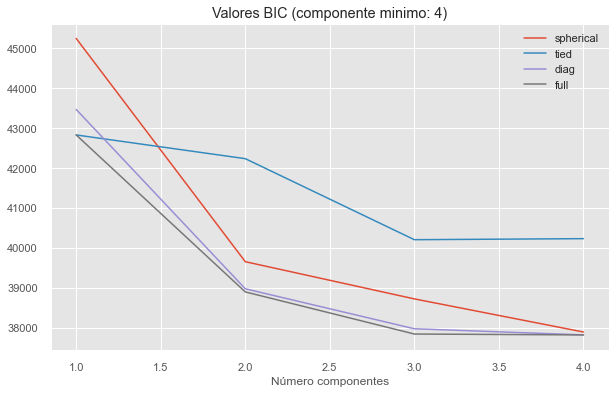

In [58]:
plot_model_gm(df_num[['CouponUsed', 'DaySinceLastOrder']].dropna(axis = 0, how = 'any'))

Esta primer función calcula y grafica los diferentes tipos de matriz de covarianza para diferentes componentes. Sirve para identificar el número de componente que minimiza el BIC.

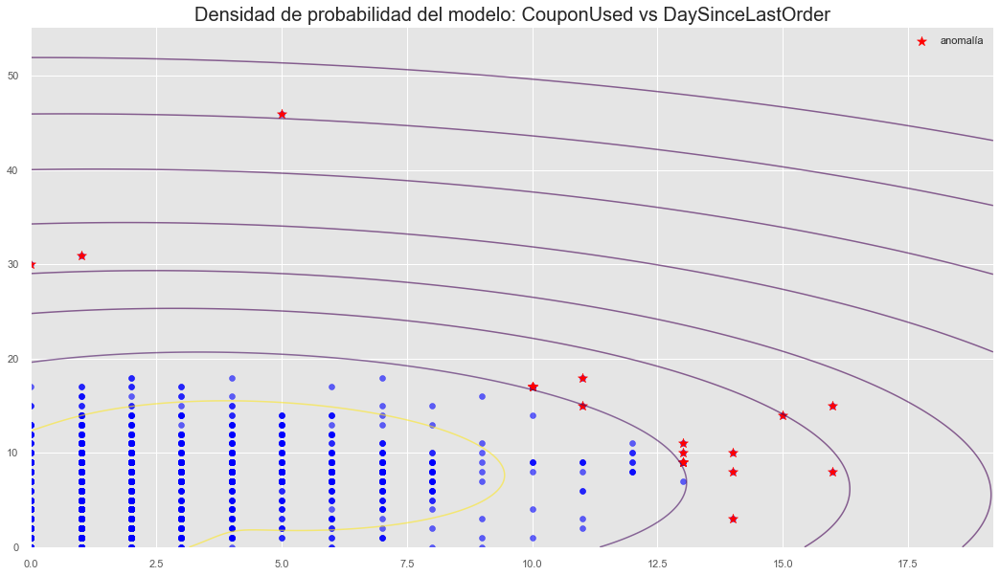

In [59]:
plot_anomalies_gm(data = df_num[['CouponUsed', 'DaySinceLastOrder']].dropna(axis = 0, how = 'any'),
                  componentes = 3, tipo = 'full', outliers = 20)

<div class=text-justify>
Esta segunda función genera la grafica anterior, en la cual se aprecian los posibles casos atípicos. Hay que recordar que el número de observaciones que se consideran atípicas se debe especificar como argumento de esta función. Podemos ver que en este gráfico si hay casos atípicos, los cuales coinciden con sus respectivas gráficas individuales.
 </div>

**Tenure vs DaySinceLastOrder**

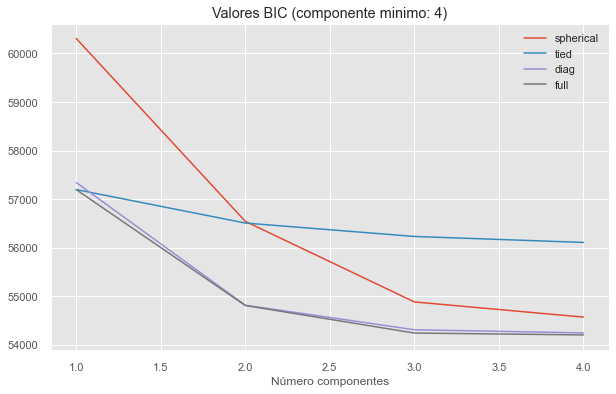

In [60]:
plot_model_gm(df_num[['Tenure', 'DaySinceLastOrder']].dropna(axis = 0, how = 'any'))

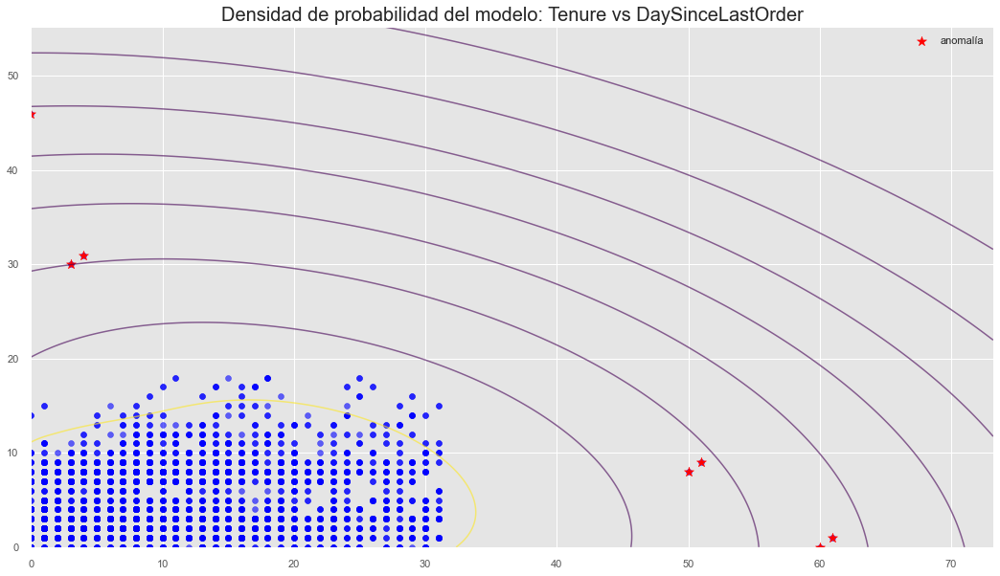

In [61]:
plot_anomalies_gm(data = df_num[['Tenure', 'DaySinceLastOrder']].dropna(axis = 0, how = 'any'),
                  componentes = 3, tipo = 'full', outliers = 7)

**OrderCount vsDaySinceLastOrder**

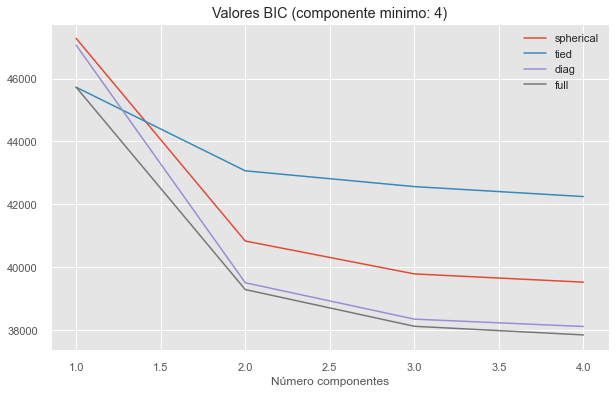

In [62]:
plot_model_gm(df_num[['OrderCount', 'DaySinceLastOrder']].dropna(axis = 0, how = 'any'))

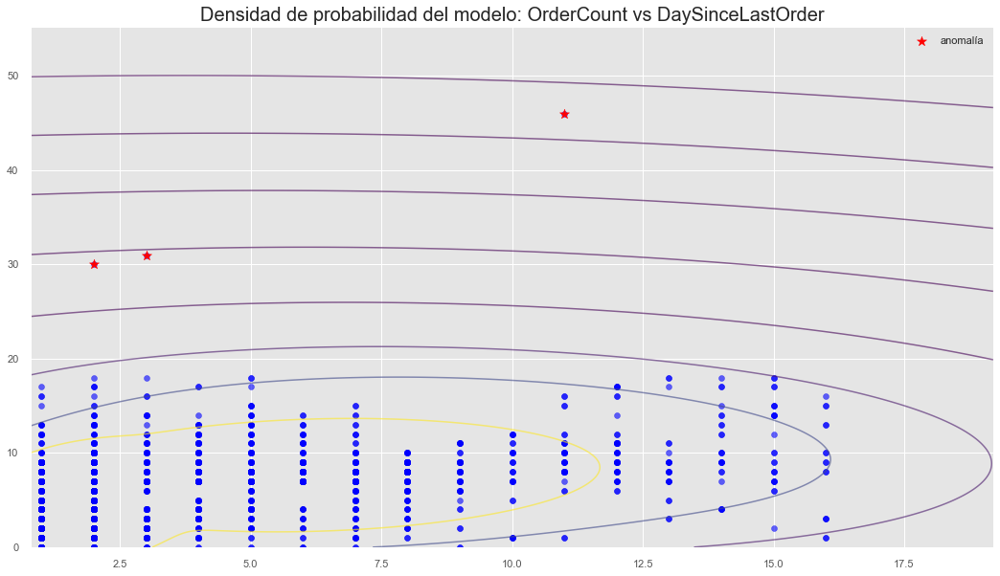

In [63]:
plot_anomalies_gm(data = df_num[['OrderCount', 'DaySinceLastOrder']].dropna(axis = 0, how = 'any'),
                  componentes = 4, tipo = 'full', outliers = 3)

<div class=text-justify>
Las gráficas anteriores solo fueron unos casos de análisis bivariantes para detectar outliers. Hasta aquí, solo se identificaron los outliers y más adelante se tratarán, ya que es necesario para no tener problemas a la hora de entrenar los modelos. A continuación, se analizarán las observaciones faltantes y su proceso generardor para, en base a ello, definir la estratégia de imputación o eliminación.
</div>

## Diagnóstico observaciones faltantes

Antes de seguir, vamos a identificar y cuantificar las variables que contienen valores faltantes:

In [64]:
def summary_nulls(df):
    
    missing_columns = pd.DataFrame()
    total = df.shape[0]
    
    missing_columns['Variable'] = [col for col in df.columns if df[col].isnull().sum() > 0]
    columns_nulls = missing_columns['Variable'].to_numpy()   
    
    missing_columns['Nulls'] = [df[col].isnull().sum() for col in columns_nulls]
    missing_columns['Percentage'] = missing_columns['Nulls'].apply(lambda x: round((x / total) * 100, 3))
    
    missing_columns.sort_values(by = 'Percentage', ascending = False)
    
    return missing_columns

In [65]:
summary_nulls(df)

,Variable,Nulls,Percentage
0,Tenure,231,4.553
1,WarehouseToHome,221,4.356
2,HourSpendOnApp,230,4.533
3,OrderAmountHikeFromlastYear,252,4.966
4,CouponUsed,210,4.139
5,OrderCount,243,4.789
6,DaySinceLastOrder,288,5.676


Hay 7 variables que contienen valores faltantes y en todas el porcentaje es mayor al 4%.

Con apoyo de un dendograma se tratará de identificar si existen correlaciones entre esas variables. El objetivo es identificar el proceso generador de datos faltantes para elegir el método más adecuado de imputación.

In [66]:
missing_columns = [col for col in df.columns if df[col].isnull().sum() > 0]
missing_columns

['Tenure',
 'WarehouseToHome',
 'HourSpendOnApp',
 'OrderAmountHikeFromlastYear',
 'CouponUsed',
 'OrderCount',
 'DaySinceLastOrder']

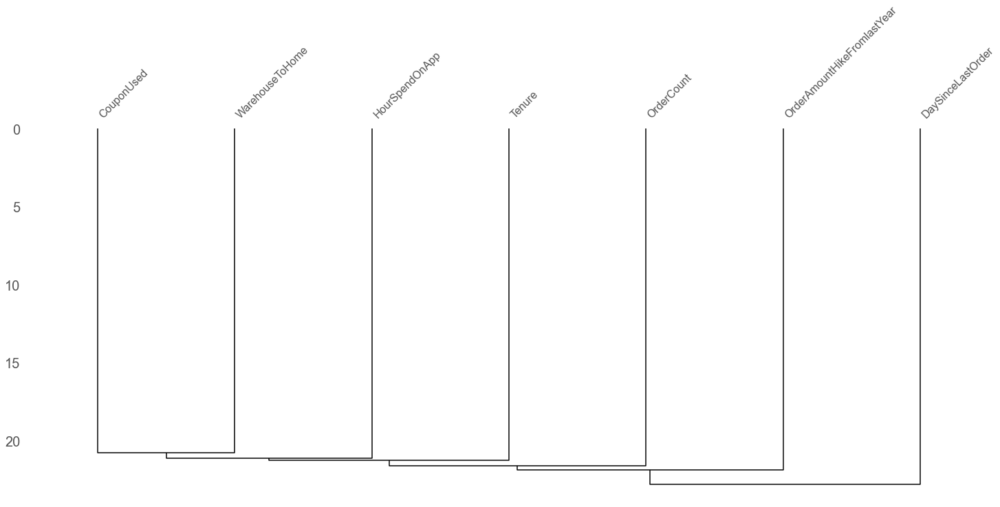

In [67]:
msno.dendrogram(df[missing_columns]);

<div class=text-justify>
Interpretamos el dendrograma basado en un enfoque de arriba hacia abajo (top-down), es decir, para centrarnos en la altura a la que se unen dos columnas con cuestiones de nulidad. Entre más sea la altura, menos será la relación y viceversa. Por lo tanto, la mejor estratégia a seguir para la imputación de esos valores faltantes será la media o mediana de cada variable.
</div>

In [68]:
df_temp = df.copy()
df_temp

,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,120.875
1,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120.250
2,1,11.0,Mobile Phone,1,6.0,Debit Card,Male,3.0,4,Fashion,3,Single,10,1,13.0,0.0,1.0,0.0,153.750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5627,0,13.0,Mobile Phone,1,13.0,Credit Card,Male,3.0,5,Fashion,5,Married,6,0,16.0,1.0,2.0,NaN,224.875
5628,0,1.0,Mobile Phone,1,11.0,Debit Card,Male,3.0,2,Laptop & Accessory,4,Married,3,1,21.0,1.0,2.0,4.0,186.375
5629,0,8.0,Mobile Phone,1,15.0,Credit Card,Male,3.0,2,Laptop & Accessory,3,Married,4,0,13.0,2.0,2.0,3.0,169.000


<div class=text-justify>
Para complementar este análisis se creará una función que compare las variables con valores faltantes versus algunas variables con datos no faltantes para determinar si hay alguna relación o dependencia con ellas. Esto se hará con apoyo de la prueba <b>chi-2</b> y con variables dummy que funcionarán como banderas, o sea, tendran el valor de True donde haya un valor faltante y False donde exista observación. Recordar que la hipótesis nula es que los datos son <b>MCAR (Missing Completely at Random).</b>
</div>

In [69]:
def my_test_MCAR(data, vars_X, list_nans):
    
    for var_X in vars_X.columns:
        
        print('Análisis con respecto a: {}\n==================================================='.format(var_X))
        
        for col in list_nans.columns:

            alpha = 0.05
            table = []

            data["Var_missing"] = data[col]
            data["Var_missing"] = False
            data.loc[data[data[col].isnull()].index, "Var_missing"] = True

            cross_tab = pd.crosstab(data[var_X], data['Var_missing'])

            np.array(cross_tab).ravel()
            array_1 = np.array(cross_tab).ravel()[0:2]
            array_2 = np.array(cross_tab).ravel()[2:4]

            table.append(array_1)
            table.append(array_2)

            chi2, p, dof, ex = chi2_contingency(table)
    
    
            if p > alpha:

                print("El p-value es: {}\nLas variables {} y {} son independientes\n".format(p,var_X,col))
            else:

                print("El p-value es: {}\nLas variables {} y {} no son independientes\n".format(p,var_X,col))

In [70]:
my_test_MCAR(df_temp, vars_X = df[['Gender','CityTier','Complain','MaritalStatus']], list_nans = df[missing_columns])

Análisis con respecto a: Gender
El p-value es: 0.28742189354876957
Las variables Gender y Tenure son independientes

El p-value es: 0.9168704662504923
Las variables Gender y WarehouseToHome son independientes

El p-value es: 0.2506512767376904
Las variables Gender y HourSpendOnApp son independientes

El p-value es: 0.023882496850074347
Las variables Gender y OrderAmountHikeFromlastYear no son independientes

El p-value es: 0.016576769920346113
Las variables Gender y CouponUsed no son independientes

El p-value es: 0.001019326248319203
Las variables Gender y OrderCount no son independientes

El p-value es: 0.6649729682863856
Las variables Gender y DaySinceLastOrder son independientes

Análisis con respecto a: CityTier
El p-value es: 0.022974470463302674
Las variables CityTier y Tenure no son independientes

El p-value es: 0.51929141743147
Las variables CityTier y WarehouseToHome son independientes

El p-value es: 0.31208044320582695
Las variables CityTier y HourSpendOnApp son independie

Los resultados anteriores mayormente indican que los procesos generadores de los datos faltantes son MCAR, sin embargo, hay algunas variables cuyo proceso no es MCAR. Los resultados anteriores, no son determinantes y se deben de tomar como una pieza de información más a la hora de decidir qué estrategia usar para su tratamiento.

Con esta información más el dendograma podemos establecer ya la estrategia de tratamiento. Como al parecer el proceso generador de datos faltantes en este conjunto de datos es MCAR, algunas variables podrán ser imputadas por la mediana o aleatoriamente. Veamos algunas gráficas antes y despues de la imputación para saber si qué estratégia modifica más las distribuciones originales.

In [71]:
def impute_nas(df, variable):
    
    col_type = df[variable].dtype
    
    # mediana
    df[variable + '_median'] = df[variable].copy()
    mediana = df[variable].median()
    df.iloc[:, -1:] = df.iloc[:, -1:].fillna(mediana)
    
    # muestra aleatoria
    df[variable + '_random'] = df[variable].copy()
    random_sample = df[variable].dropna().sample(
    df[variable].isnull().sum(), random_state = 123)
    random_sample.index = df[df[variable].isnull()].index
    df.loc[df[variable].isnull(), variable + '_random'] = random_sample
    
    # media
    if str(col_type) == 'float16':
    
        df[variable + '_media'] = df[variable].copy()
        media = df[variable + '_media'].astype(np.float32).mean()
        df.iloc[:, -1:] = np.round(df.iloc[:, -1:].fillna(media))
        
    else:
        
        df[variable + '_media'] = df[variable].copy()
        media = df[variable].mean()
        df.iloc[:, -1:] = np.round(df.iloc[:, -1:].fillna(media))
        
    
    fig = plt.figure(figsize = (18, 11))
    
    # primer grafico (0,0)
    ax1 = plt.subplot2grid((2, 3), (0, 0), 1, 1)
    
    df[variable].plot(kind = 'kde', ax = ax1, color = 'orange', lw = 3, label = variable)
    df[variable + '_median'].plot(kind = 'kde', ax = ax1, color = 'dodgerblue', label = variable + '_median')
    ax1.set_title('Varianza {}: {}\nVarianza {}: {}'.format(variable,df[variable].var(), str(variable) + '_median',df[variable + '_median'].var()), fontsize = 12, fontweight = 'bold')
    ax1.legend(loc = 'best')
    
    # segundo grafico (0,1)
    ax2 = plt.subplot2grid((2, 3), (0, 1), 1, 1)
    
    df[variable].plot(kind = 'kde', ax = ax2, color = 'orange', lw = 3, label = variable)
    df[variable + '_random'].plot(kind = 'kde', ax = ax2, color = 'dodgerblue', label = variable + '_random')
    ax2.set_title('Varianza {}: {}\nVarianza {}: {}'.format(variable,df[variable].var(), str(variable) + '_random',df[variable + '_random'].var()), fontsize = 12, fontweight = 'bold')
    ax2.legend(loc = 'best')
    
    # tercer grafico (0,2)
    ax3 = plt.subplot2grid((2, 3), (0, 2), 1, 1)
    
    df[variable].plot(kind = 'kde', ax = ax3, color = 'orange', lw = 3, label = variable)
    df[variable + '_media'].plot(kind = 'kde', ax = ax3, color = 'dodgerblue', label = variable + '_media')
    ax3.set_title('Varianza {}: {}\nVarianza {}: {}'.format(variable,df[variable].var(), str(variable) + '_media',df[variable + '_media'].var()), fontsize = 12, fontweight = 'bold')
    ax3.legend(loc = 'best')
    
    # cuarto grafico (1,0)
    ax4 = plt.subplot2grid((2, 3), (1, 0), 1, 3)
    
    df.boxplot(column = [variable, variable + '_median', variable + '_random', variable + '_media'], ax = ax4)
    
    plt.suptitle('Comparativo: Diferentes Estrategias de Imputación', size = 18)
    plt.show()
    
    df.drop(columns = [variable + '_median', variable + '_random', variable + '_media'], inplace = True)

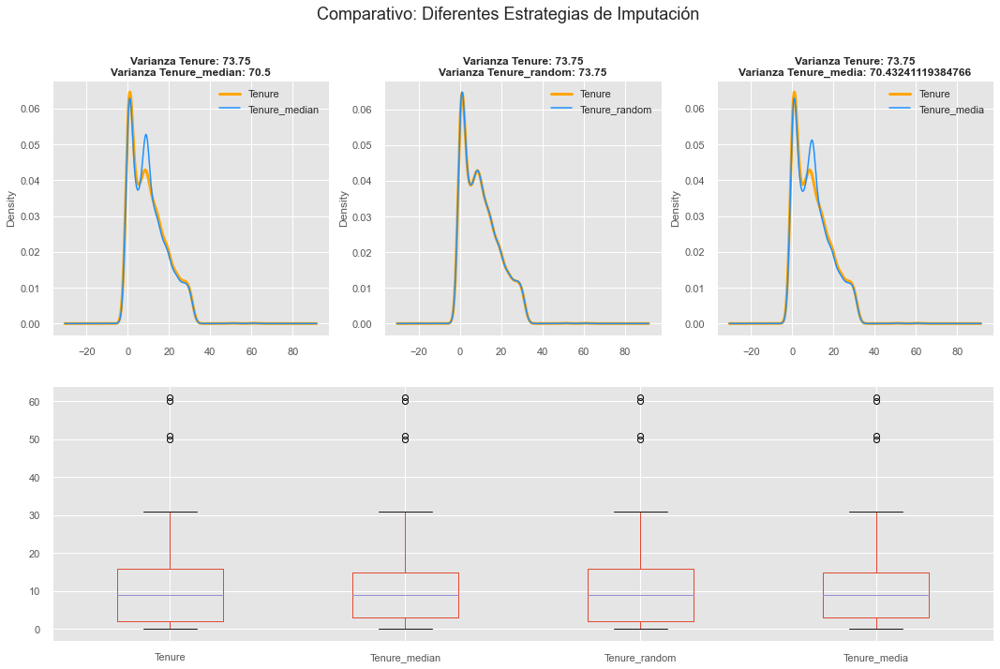

In [72]:
impute_nas(df, 'Tenure')

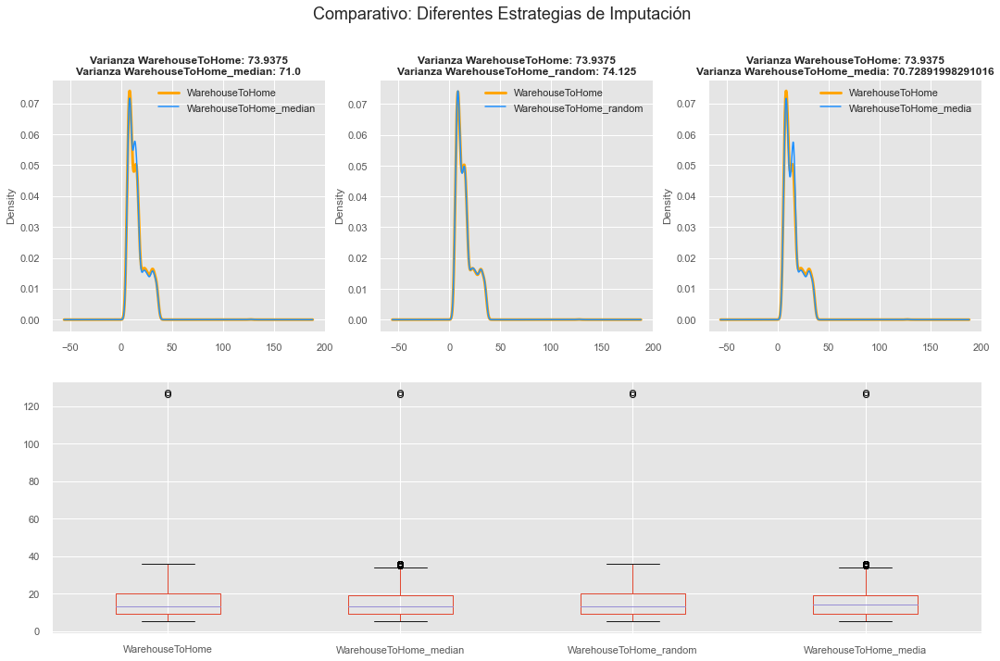

In [73]:
impute_nas(df, 'WarehouseToHome')

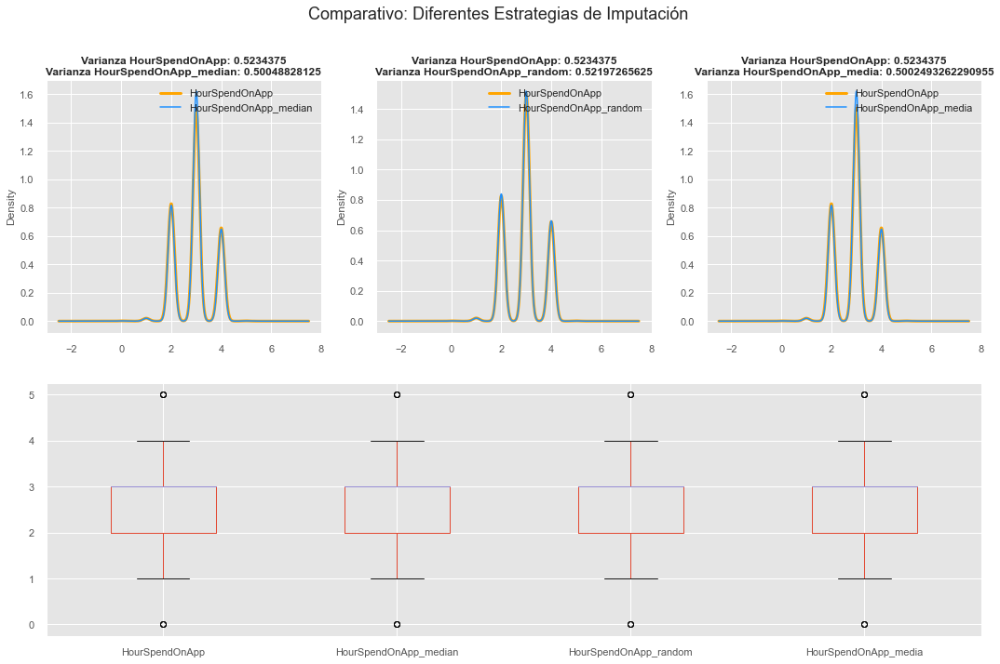

In [74]:
impute_nas(df, 'HourSpendOnApp')

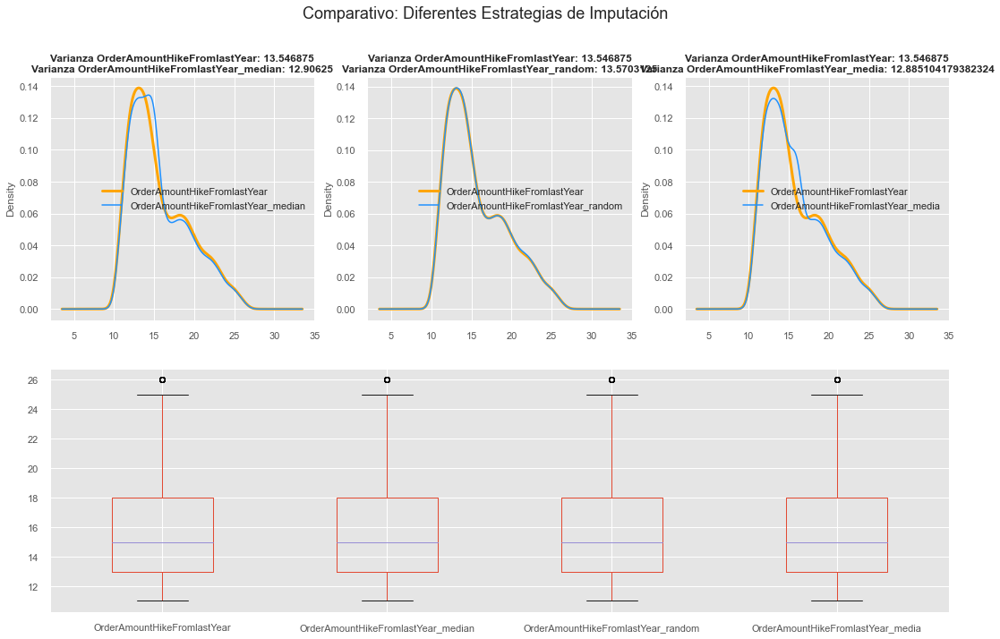

In [75]:
impute_nas(df, 'OrderAmountHikeFromlastYear')

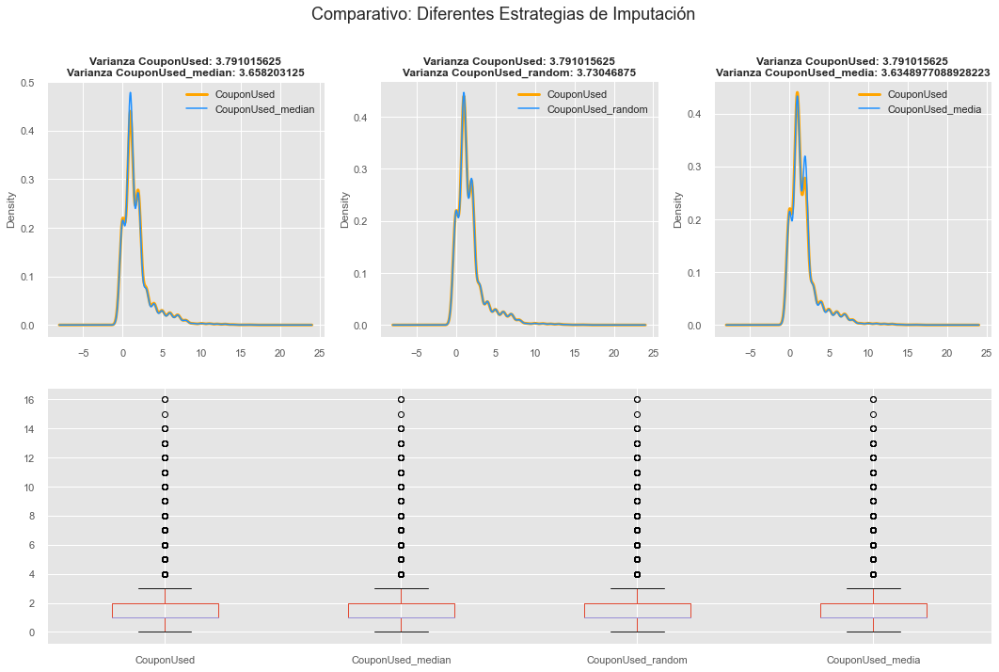

In [76]:
impute_nas(df, 'CouponUsed')

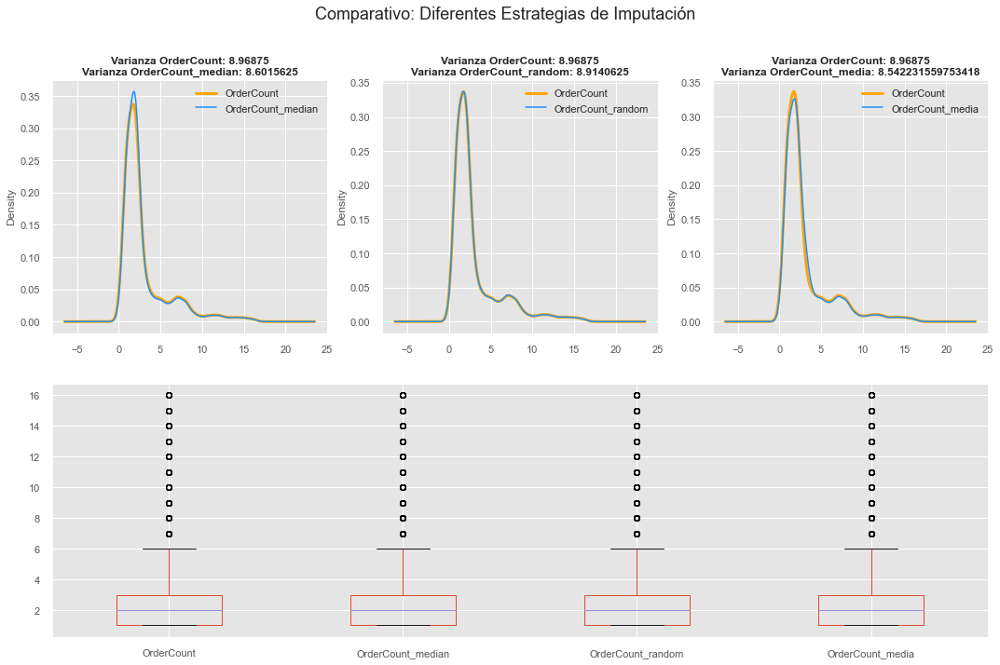

In [77]:
impute_nas(df, 'OrderCount')

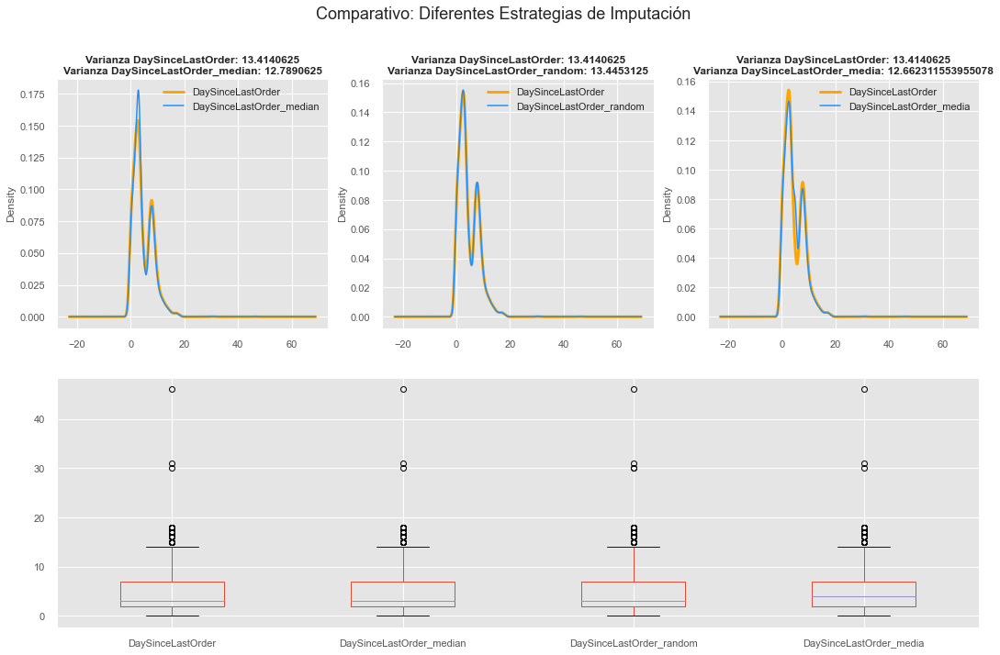

In [78]:
impute_nas(df, 'DaySinceLastOrder')

Del análisis visual se concluye que al parecer la mejor estratégia de imputación es mediante muestreo aleatorio, ya que prácticamente, no se ve alterada la distribución original de la variable en cuestión. Por lo tanto, esa será la forma de tratar los valores faltantes.

**Conclusiones generales**

Una vez realizado todos los análisis que se consideran necesarios para conocer la data, se decidío hacer lo siguiente:

* Para el tratamiento de los valores atípicos, aunque no es necesario tartarlos porque los algoritmos a usar no son sensibles a ellos, se eliminarán solo los que están presente en las variables: `Tenure`, `WarehouseToHome` y `DaySinceLastOrder`.

* En cuanto a los valores faltantes, se seguirá la estratégia de la imputación por muestreo aleatorio, ya que fue la que preservo en mayor medida la distribución original.

# División del dataset

<div class=text=justify>
Hasta aquí, se han estado haciendo análisis y diagnósticos al conjunto de datos sin modificar la base original, pues el objetivo era la exploración y el análisis, sin embargo, a partir de la siguiente sección, ya se modificarán los datos, porque se estarán preparando para entrenar los diferentes modelos. Por lo tanto, se obtendrán tres subconjuntos de datos: entrenamiento, prueba y validación. Además, para evitar el sobreajuste toda modificación se hará sobre el conjunto de entrenamiento y, posteriormente, se aplicarán esas modificaciones a los conjuntos restantes.
</div>

Se separan las variables que serán las predictoras y la target

In [79]:
X = df.drop(columns = 'Churn')
y = df.Churn

Se prepara el conjunto de validación

In [80]:
np.random.seed(123)

aleatorio = np.random.choice([0, 1], size = df.shape[0], p = [0.8, 0.2])

X_val = X.loc[aleatorio == 1,]
y_val = y.loc[aleatorio == 1,]

print(X_val.shape)
print(y_val.shape)

(1009, 18)
(1009,)


In [81]:
X = X.loc[aleatorio == 0,]
y = y.loc[aleatorio == 0,]

Conjunto de entrenamiento y prueba

In [82]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(3252, 18)
(813, 18)
(3252,)
(813,)


# Tratamiento valores atípicos

<div class=text-justify>
Como se mencionó anteriormente, las observaciones atípicas no afectan a los algoritmos basados en los árboles, por lo que, no es necesario tratarlos para este proyecto, debido a que se pondrán a competir ese tipo de algoritmos, sin embargo, para fines de mostrar su tratamiento se trabajaran las siguientes variables: <i>Tenure</i>, <i>WarehouseToHome</i>, <i>DaySinceLastOrder</i>, <i>NumberOfAddress</i>, <i>OrderAmountHikeFromlastYear</i> y <i>CouponUsed</i>.
</div>

La estratégia elegida será la de truncamiento, ya que son muy pocas observaciones las que resultaron atípicas. Otra opción recomendada sería la de eliminación, sin embargo, para fines didácticos se decidió por la primera.

Primero se identifica en dónde se hará el truncamiento, pues éste se hara con valores fijos.

In [83]:
X_train.groupby('Tenure', as_index = False) \
    .size().sort_values(by = 'Tenure').tail(10)

,Tenure,size
24,24.0,40
25,25.0,38
26,26.0,30
27,27.0,35
28,28.0,32
29,29.0,33
30,30.0,45
31,31.0,33
32,50.0,1
33,60.0,1


In [84]:
X_train.groupby('WarehouseToHome', as_index = False) \
    .size().sort_values(by = 'WarehouseToHome').tail(10)

,WarehouseToHome,size
24,29.0,45
25,30.0,53
26,31.0,58
27,32.0,52
28,33.0,37
29,34.0,45
30,35.0,48
31,36.0,31
32,126.0,1
33,127.0,1


In [85]:
df.groupby('DaySinceLastOrder', as_index = False) \
    .size().sort_values(by = 'DaySinceLastOrder').tail(10)

,DaySinceLastOrder,size
12,12.0,65
13,13.0,44
14,14.0,32
15,15.0,17
16,16.0,12
17,17.0,16
18,18.0,9
19,30.0,1
20,31.0,1
21,46.0,1


In [86]:
capper = outr.ArbitraryOutlierCapper(
    max_capping_dict = {'Tenure':31,
                        'WarehouseToHome':36,
                        'DaySinceLastOrder':18,
                        'NumberOfAddress':11, 
                        'OrderAmountHikeFromlastYear':24, 
                        'CouponUsed':12},
    min_capping_dict = None,
    missing_values = 'ignore')

capper.fit(X_train)

ArbitraryOutlierCapper(max_capping_dict={'CouponUsed': 12,
                                         'DaySinceLastOrder': 18,
                                         'NumberOfAddress': 11,
                                         'OrderAmountHikeFromlastYear': 24,
                                         'Tenure': 31, 'WarehouseToHome': 36},
                       missing_values='ignore')

In [87]:
X_train_cap = capper.transform(X_train)
X_test_cap = capper.transform(X_test)
X_val_cap = capper.transform(X_val)

Se verifican las distribuciones originales vs las truncadas

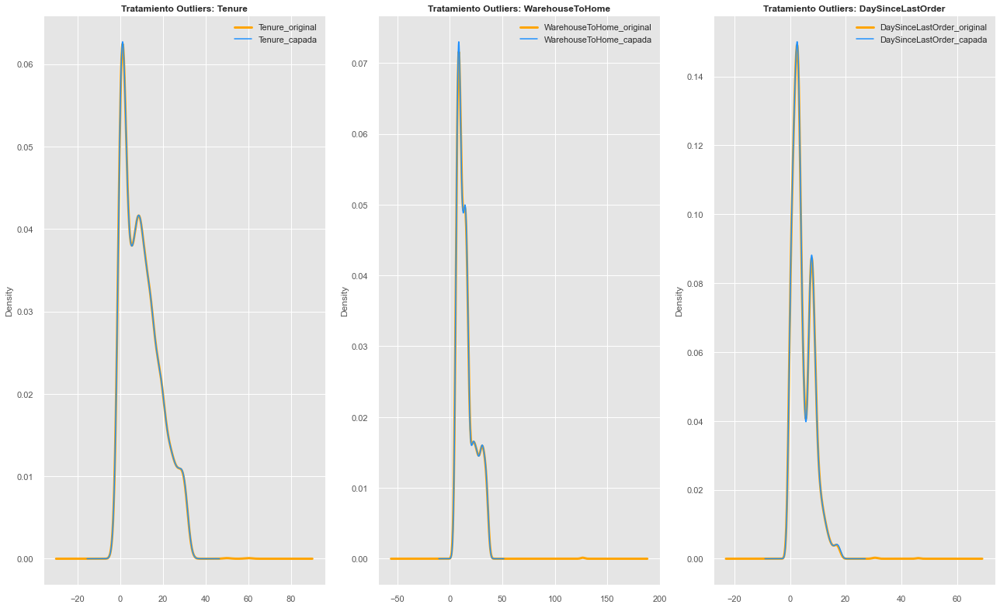

In [88]:
fig = plt.figure(figsize = (18, 11))
    
# primer grafico (0,0)
ax1 = plt.subplot2grid((1, 3), (0, 0), 1, 1)

X_train['Tenure'].plot(kind = 'kde', ax = ax1, color = 'orange', lw = 3, label = 'Tenure_original')
X_train_cap['Tenure'].plot(kind = 'kde', ax = ax1, color = 'dodgerblue', label = 'Tenure_capada')
ax1.set_title('Tratamiento Outliers: Tenure', fontsize = 12, fontweight = 'bold')
ax1.legend(loc = 'best')

# segundo grafico (0,1)
ax2 = plt.subplot2grid((1, 3), (0, 1), 1, 1)

X_train['WarehouseToHome'].plot(kind = 'kde', ax = ax2, color = 'orange', lw = 3, label = 'WarehouseToHome_original')
X_train_cap['WarehouseToHome'].plot(kind = 'kde', ax = ax2, color = 'dodgerblue', label = 'WarehouseToHome_capada')
ax2.set_title('Tratamiento Outliers: WarehouseToHome', fontsize = 12, fontweight = 'bold')
ax2.legend(loc = 'best')

# tercer grafico (0,2)
ax3 = plt.subplot2grid((1, 3), (0, 2), 1, 1)

X_train['DaySinceLastOrder'].plot(kind = 'kde', ax = ax3, color = 'orange', lw = 3, label = 'DaySinceLastOrder_original')
X_train_cap['DaySinceLastOrder'].plot(kind = 'kde', ax = ax3, color = 'dodgerblue', label = 'DaySinceLastOrder_capada')
ax3.set_title('Tratamiento Outliers: DaySinceLastOrder', fontsize = 12, fontweight = 'bold')
ax3.legend(loc = 'best')


fig.tight_layout()

plt.show()

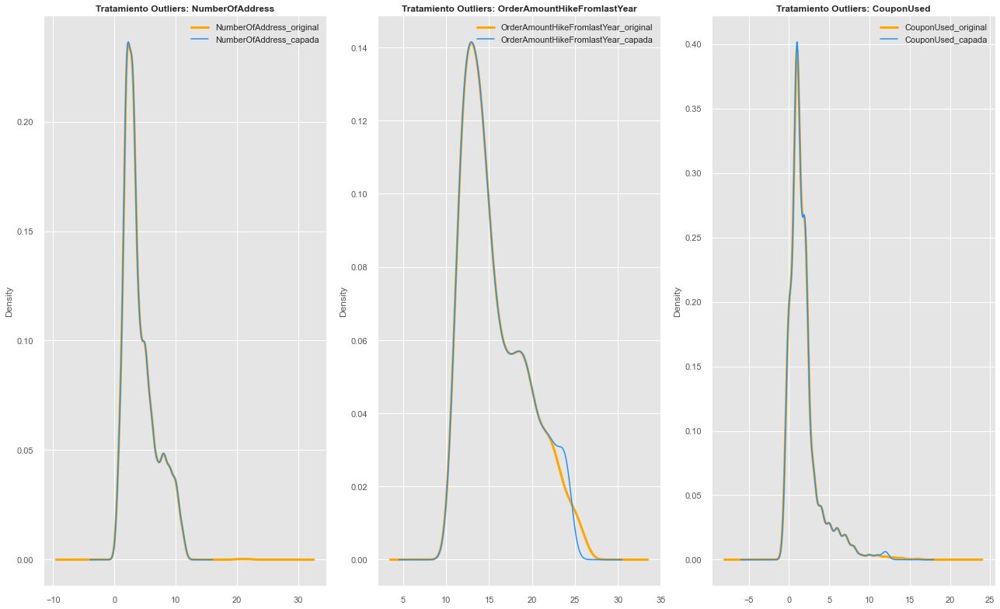

In [89]:
fig = plt.figure(figsize = (18, 11))
    
# primer grafico (0,0)
ax1 = plt.subplot2grid((1, 3), (0, 0), 1, 1)

X_train['NumberOfAddress'].plot(kind = 'kde', ax = ax1, color = 'orange', lw = 3, label = 'NumberOfAddress_original')
X_train_cap['NumberOfAddress'].plot(kind = 'kde', ax = ax1, color = 'dodgerblue', label = 'NumberOfAddress_capada')
ax1.set_title('Tratamiento Outliers: NumberOfAddress', fontsize = 12, fontweight = 'bold')
ax1.legend(loc = 'best')

# segundo grafico (0,1)
ax2 = plt.subplot2grid((1, 3), (0, 1), 1, 1)

X_train['OrderAmountHikeFromlastYear'].plot(kind = 'kde', ax = ax2, color = 'orange', lw = 3, label = 'OrderAmountHikeFromlastYear_original')
X_train_cap['OrderAmountHikeFromlastYear'].plot(kind = 'kde', ax = ax2, color = 'dodgerblue', label = 'OrderAmountHikeFromlastYear_capada')
ax2.set_title('Tratamiento Outliers: OrderAmountHikeFromlastYear', fontsize = 12, fontweight = 'bold')
ax2.legend(loc = 'best')

# tercer grafico (0,2)
ax3 = plt.subplot2grid((1, 3), (0, 2), 1, 1)

X_train['CouponUsed'].plot(kind = 'kde', ax = ax3, color = 'orange', lw = 3, label = 'CouponUsed_original')
X_train_cap['CouponUsed'].plot(kind = 'kde', ax = ax3, color = 'dodgerblue', label = 'CouponUsed_capada')
ax3.set_title('Tratamiento Outliers: CouponUsed', fontsize = 12, fontweight = 'bold')
ax3.legend(loc = 'best')


fig.tight_layout()

plt.show()

# Tratamiento valores ausentes

Para el tratamiento de valores faltantes la estratégia a seguir será la imputación por muestreo aleatorio, ya que en el análisis que se hizo sobre estos valores se determinó que el proceso generador fue **MCAR (Missing Completely at Random)**, por lo que, se puede usar esa estratégia.

In [90]:
imputer = RandomSampleImputer(
        random_state = None,
        seed = 'general')

imputer.fit(X_train_cap)

RandomSampleImputer()

In [91]:
X_train_cap_f = imputer.transform(X_train_cap)
X_test_cap_f = imputer.transform(X_test_cap)
X_val_cap_f = imputer.transform(X_val_cap)

Se validan las distribuciones de algunas variables, para ver si hubo alteraciones en ellas después de la imputación.

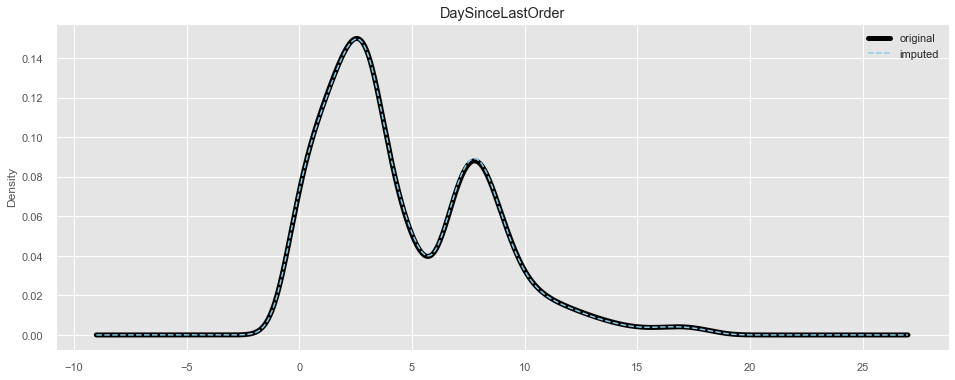

In [92]:
fig = plt.figure(figsize = (16, 6))

ax = fig.add_subplot(111)

X_train_cap['DaySinceLastOrder'].plot(kind = 'kde', ax = ax, label = 'original', color = 'black', lw = 5)
X_train_cap_f['DaySinceLastOrder'].plot(kind ='kde', ax = ax, color = 'skyblue', label = 'imputed', ls = '--')
ax.set_title('DaySinceLastOrder')
ax.legend(loc = 'best');

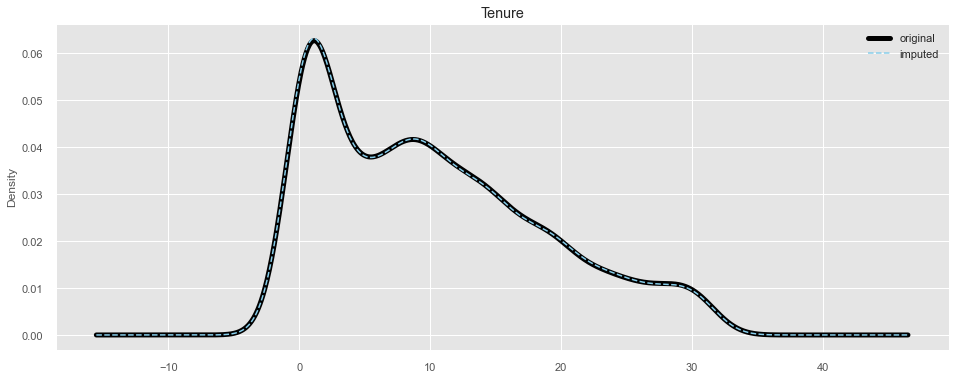

In [93]:
fig = plt.figure(figsize = (16, 6))

ax = fig.add_subplot(111)

X_train_cap['Tenure'].plot(kind = 'kde', ax = ax, label = 'original', color = 'black', lw = 5)
X_train_cap_f['Tenure'].plot(kind ='kde', ax = ax, color = 'skyblue', label = 'imputed', ls = '--')
ax.set_title('Tenure')
ax.legend(loc = 'best');

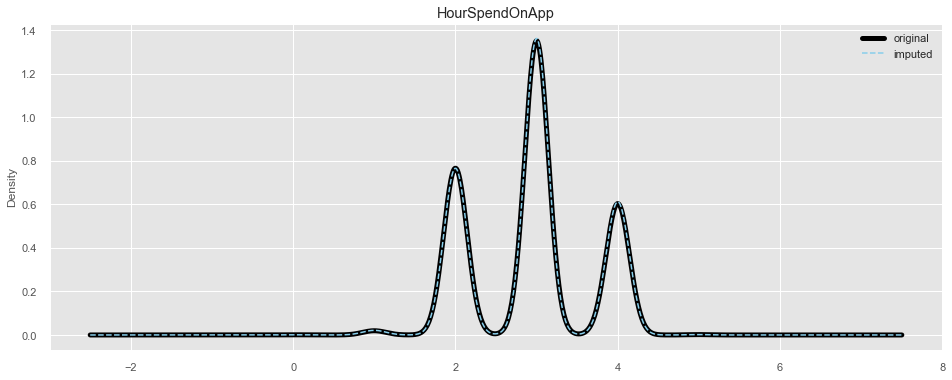

In [94]:
fig = plt.figure(figsize = (16, 6))

ax = fig.add_subplot(111)

X_train_cap['HourSpendOnApp'].plot(kind = 'kde', ax = ax, label = 'original', color = 'black', lw = 5)
X_train_cap_f['HourSpendOnApp'].plot(kind ='kde', ax = ax, color = 'skyblue', label = 'imputed', ls = '--')
ax.set_title('HourSpendOnApp')
ax.legend(loc = 'best');

In [95]:
X_train_cap_f.isna().sum()

Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

In [96]:
X_test_cap_f.isna().sum()

Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

In [97]:
X_val_cap_f.isna().sum()

Tenure                         0
PreferredLoginDevice           0
CityTier                       0
WarehouseToHome                0
PreferredPaymentMode           0
Gender                         0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
PreferedOrderCat               0
SatisfactionScore              0
MaritalStatus                  0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
dtype: int64

# Recodificación de variables

<div class=text-justify>
En esta sección solo se agruparán las categorías poco frecuentes de las variables categóricas, ya que podemos correr el riesgo de que etiquetas con pocas observaciones solo se encuentren en el set de entrenamiento y no en el conjunto de prueba o viceversa, además, a la hora de entrenar los modelos usando validación cruzada puede que una muestra de entrenamiento no contenga esa etiqueta poco frecuente. Las variables a recodificar son: <i>PreferredPaymentMode</i> y <i>PreferedOrderCat</i>.
</div>

PreferredPaymentMode

In [98]:
X_val_cap_f.PreferredPaymentMode.value_counts(normalize = True, dropna = False)

Debit Card          0.427156
Credit Card         0.258672
E wallet            0.105055
COD                 0.074331
UPI                 0.062438
CC                  0.053518
Cash on Delivery    0.018831
Name: PreferredPaymentMode, dtype: float64

PreferedOrderCat

In [99]:
X_val_cap_f.PreferedOrderCat.value_counts(normalize = True, dropna = False)

Laptop & Accessory    0.382557
Mobile Phone          0.217047
Fashion               0.146680
Mobile                0.138751
Grocery               0.074331
Others                0.040634
Name: PreferedOrderCat, dtype: float64

In [100]:
rle = RareLabelEncoder(n_categories = 2, 
                       tol = 0.085,
                       variables = ['PreferredPaymentMode', 'PreferedOrderCat'],
                       replace_with = 'OTROS')

rle.fit(X_train_cap_f)

RareLabelEncoder(n_categories=2, replace_with='OTROS', tol=0.085,
                 variables=['PreferredPaymentMode', 'PreferedOrderCat'])

In [101]:
X_train_cap_f = rle.transform(X_train_cap_f)
X_test_cap_f = rle.transform(X_test_cap_f)
X_val_cap_f = rle.transform(X_val_cap_f)

Confirmamos la recodificación

In [102]:
X_train_cap_f.PreferredPaymentMode.value_counts(normalize = True, dropna = False)

Debit Card     0.411439
Credit Card    0.269065
OTROS          0.204490
E wallet       0.115006
Name: PreferredPaymentMode, dtype: float64

In [103]:
X_test_cap_f.PreferredPaymentMode.value_counts(normalize = True, dropna = False)

Debit Card     0.405904
Credit Card    0.260763
OTROS          0.232472
E wallet       0.100861
Name: PreferredPaymentMode, dtype: float64

In [104]:
X_val_cap_f.PreferredPaymentMode.value_counts(normalize = True, dropna = False)

Debit Card     0.427156
Credit Card    0.258672
OTROS          0.209118
E wallet       0.105055
Name: PreferredPaymentMode, dtype: float64

In [105]:
X_train_cap_f.PreferedOrderCat.value_counts(normalize = True, dropna = False)

Laptop & Accessory    0.362854
Mobile Phone          0.224785
Fashion               0.150984
Mobile                0.140529
OTROS                 0.120849
Name: PreferedOrderCat, dtype: float64

In [106]:
X_test_cap_f.PreferedOrderCat.value_counts(normalize = True, dropna = False)

Laptop & Accessory    0.345633
Mobile Phone          0.221402
Mobile                0.158672
Fashion               0.152522
OTROS                 0.121771
Name: PreferedOrderCat, dtype: float64

In [107]:
X_val_cap_f.PreferedOrderCat.value_counts(normalize = True, dropna = False)

Laptop & Accessory    0.382557
Mobile Phone          0.217047
Fashion               0.146680
Mobile                0.138751
OTROS                 0.114965
Name: PreferedOrderCat, dtype: float64

## Discretización

En esta parte se reajustarán las variables que presentan pocas observaciones y pocas etiquetas. Lo anterior, para evitar que haya etiquetas en un conjunto de datos y no en otro. Las variables a trabajar son: `CityTier`, `HourSpendOnApp` y `NumberofDeviceRegistered`. La variable `OrderCount` se discretizará utilizando intervalos de frecuencias con el objetivo de agrupar las etiquetas menos frecuentes.

**CityTier**

Se crearán solo dos etiquetas:

* Las observaciones que son iguales a 1 y mayores a 1.

In [108]:
def disc1(df_train, df_test, df_val, variable):
    
    df_train[variable + '_disc'] = np.where(df_train[variable] == 1, str(1), 'mayor_1')
    df_train.drop(columns = variable, inplace = True)
    
    df_test[variable + '_disc'] = np.where(df_test[variable] == 1, str(1), 'mayor_1')
    df_test.drop(columns = variable, inplace = True)
    
    df_val[variable + '_disc'] = np.where(df_val[variable] == 1, str(1), 'mayor_1')
    df_val.drop(columns = variable, inplace = True)

In [109]:
disc1(df_train = X_train_cap_f, df_test = X_test_cap_f, df_val = X_val_cap_f, variable = 'CityTier')

**HourSpendOnApp**

Para esta variable se crearán segmentos como sigue:

* menos de tres.
* Tres.
* Más de tres.

In [110]:
def disc2(df_train, df_test, df_val, variable):
    
    df_train[variable + '_disc'] = np.where(df_train[variable] < 3.0, 'menor_3',
                                              np.where(df_train[variable] == 3.0, str(3), 'mayor_3'))
    
    df_test[variable + '_disc'] = np.where(df_test[variable] < 3.0, 'menor_3',
                                              np.where(df_test[variable] == 3.0, str(3), 'mayor_3'))
    
    df_val[variable + '_disc'] = np.where(df_val[variable] < 3.0, 'menor_3',
                                              np.where(df_val[variable] == 3.0, str(3), 'mayor_3'))
    
    df_train.drop(columns = variable, inplace = True)
    df_test.drop(columns = variable, inplace = True)
    df_val.drop(columns = variable, inplace = True)

In [111]:
disc2(df_train = X_train_cap_f, df_test = X_test_cap_f, df_val = X_val_cap_f, variable = 'HourSpendOnApp')

**NumberofDeviceRegistered**

Esta variable quedá como sigue:

* Menos de tres.
* Tres.
* Cuatro.
* Mayor a cuatro.

In [112]:
def disc3(df_train, df_test, df_val, variable):
    
    df_train[variable + '_disc'] = np.where(df_train[variable] < 3.0, 'menor_3',
                                              np.where(df_train[variable] == 3.0, str(3),
                                              np.where(df_train[variable] == 4.0, str(4), 'mayor_4')))
    
    df_test[variable + '_disc'] = np.where(df_test[variable] < 3.0, 'menor_3',
                                              np.where(df_test[variable] == 3.0, str(3),
                                              np.where(df_test[variable] == 4.0, str(4), 'mayor_4')))
    
    df_val[variable + '_disc'] = np.where(df_val[variable] < 3.0, 'menor_3',
                                              np.where(df_val[variable] == 3.0, str(3),
                                              np.where(df_val[variable] == 4.0, str(4), 'mayor_4')))
    
    
    df_train.drop(columns = variable, inplace = True)
    df_test.drop(columns = variable, inplace = True)
    df_val.drop(columns = variable, inplace = True)

In [113]:
disc3(df_train = X_train_cap_f, df_test = X_test_cap_f, df_val = X_val_cap_f, variable = 'NumberOfDeviceRegistered')

**OrderCount**

Para esta variable, se considerarán intervalos de frecuencia para evitar el tener muchos cortes con pocas observaciones en cada uno, ya que esta variable presenta este problema a la derecha de su distribución.

In [114]:
disc = EqualFrequencyDiscretiser(q = 15, variables = ['OrderCount'])

disc.fit(X_train_cap_f)

EqualFrequencyDiscretiser(q=15, variables=['OrderCount'])

In [115]:
X_train_cap_f = disc.transform(X_train_cap_f)
X_test_cap_f = disc.transform(X_test_cap_f)
X_val_cap_f = disc.transform(X_val_cap_f)

# Codificación de variables

Como la variable a predecir es binaria, `Churn`, la estrategia de codificación sera la siguiente:

* Para las variables numéricas: **min-max**, para que queden en la escala [0, 1].
* Para las variables categóricas: **One-Hot-Encoding** (incluyendo todas las categorías).
* Para las variables ordinales: **Ordinal-Encoding** y, posteriormente, **min-max**.

Veamos como esta el dataframe hasta el momento.

In [116]:
X_train_cap_f

,Tenure,PreferredLoginDevice,WarehouseToHome,PreferredPaymentMode,Gender,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,CityTier_disc,HourSpendOnApp_disc,NumberOfDeviceRegistered_disc
3731,3.0,Mobile Phone,17.0,Debit Card,Male,Mobile Phone,3,Single,3,0,12.0,1.0,0,1.0,151.3750,mayor_1,3,4
5196,1.0,Computer,10.0,Debit Card,Male,Mobile Phone,1,Married,2,1,12.0,1.0,0,1.0,153.5000,1,3,mayor_4
4769,20.0,Computer,14.0,Credit Card,Female,Laptop & Accessory,3,Married,4,0,15.0,2.0,0,1.0,177.6250,1,menor_3,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1625,0.0,Phone,28.0,Debit Card,Female,Mobile,3,Divorced,5,1,11.0,0.0,0,1.0,121.3125,1,menor_3,3
4938,1.0,Mobile Phone,7.0,OTROS,Male,Mobile Phone,1,Single,3,1,14.0,7.0,4,9.0,151.8750,1,mayor_3,4
4531,2.0,Computer,11.0,Credit Card,Male,Laptop & Accessory,3,Married,3,0,16.0,1.0,0,5.0,167.2500,mayor_1,3,4


Como la variable `Complain` es binaria no es necesario hacerle ninguna transformación, por lo que, solo se saca momentáneamente de los conjuntos de datos.

In [117]:
X_train_cap_f.drop(columns = 'Complain', inplace = True)
X_test_cap_f.drop(columns = 'Complain', inplace = True)
X_val_cap_f.drop(columns = 'Complain', inplace = True)

## Min-Max Escaler

In [118]:
mms_train = X_train_cap_f.select_dtypes(exclude = ['O','category'])
mms_test = X_test_cap_f.select_dtypes(exclude = ['O','category'])
mms_val = X_val_cap_f.select_dtypes(exclude = ['O','category'])

In [119]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
scaler.fit(mms_train)

X_train_cap_scaler = scaler.transform(mms_train)
X_test_cap_scaler = scaler.transform(mms_test)
X_val_cap_scaler = scaler.transform(mms_val)

In [120]:
X_train_scaled = pd.DataFrame(X_train_cap_scaler, columns = mms_train.columns)
X_test_scaled = pd.DataFrame(X_test_cap_scaler, columns = mms_test.columns)
X_val_scaled = pd.DataFrame(X_val_cap_scaler, columns = mms_val.columns)

In [121]:
X_train_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Tenure,3252.0,0.327640,0.273618,0.0,0.064516,0.290323,0.516129,1.0
WarehouseToHome,3252.0,0.337728,0.266729,0.0,0.129032,0.258065,0.483871,1.0
SatisfactionScore,3252.0,0.506534,0.345211,0.0,0.250000,0.500000,0.750000,1.0
NumberOfAddress,3252.0,0.316728,0.254489,0.0,0.100000,0.200000,0.500000,1.0
OrderAmountHikeFromlastYear,3252.0,0.360323,0.279422,0.0,0.153846,0.307692,0.538462,1.0
CouponUsed,3252.0,0.153982,0.165520,0.0,0.083333,0.083333,0.166667,1.0
OrderCount,3252.0,0.176630,0.306469,0.0,0.000000,0.000000,0.200000,1.0
DaySinceLastOrder,3252.0,0.257141,0.201090,0.0,0.111111,0.166667,0.388889,1.0
CashbackAmount,3252.0,0.548540,0.152347,0.0,0.450385,0.504615,0.610769,1.0


## Ordinal Encoder

Las variables categóricas que llevan un orden se codificarán con el método ordinal-encoder y, posteriormente, se les aplicará el min-max escaler para dejarlas en el rango de [0, 1].

In [122]:
X_train_cap_f.dtypes

Tenure                            float16
PreferredLoginDevice             category
WarehouseToHome                   float16
PreferredPaymentMode               object
Gender                           category
PreferedOrderCat                   object
SatisfactionScore                    int8
MaritalStatus                    category
NumberOfAddress                      int8
OrderAmountHikeFromlastYear       float16
CouponUsed                        float16
OrderCount                          int64
DaySinceLastOrder                 float16
CashbackAmount                    float16
CityTier_disc                      object
HourSpendOnApp_disc                object
NumberOfDeviceRegistered_disc      object
dtype: object

Se define el orden que tendrán las categorias de las variables a codificar

In [123]:
Categorias_CityTier = ['1', 'mayor_1']
Categorias_HourSpendOnApp = ['menor_3', '3', 'mayor_3']
Categorias_NumberOfDeviceRegistered = ['menor_3', '3', '4', 'mayor_4']

In [124]:
oe = OrdinalEncoder(categories = [Categorias_CityTier, Categorias_HourSpendOnApp, Categorias_NumberOfDeviceRegistered],
                   handle_unknown = 'use_encoded_value',
                   unknown_value = 4)
oe.fit(X_train_cap_f[['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc']])

OrdinalEncoder(categories=[['1', 'mayor_1'], ['menor_3', '3', 'mayor_3'],
                           ['menor_3', '3', '4', 'mayor_4']],
               handle_unknown='use_encoded_value', unknown_value=4)

In [125]:
X_train_cap_oe = oe.transform(X_train_cap_f[['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc']])
X_test_cap_oe = oe.transform(X_test_cap_f[['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc']])
X_val_cap_oe = oe.transform(X_val_cap_f[['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc']])

In [126]:
X_train_cap_oe = pd.DataFrame(X_train_cap_oe, columns = ['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc'])
X_test_cap_oe = pd.DataFrame(X_test_cap_oe, columns = ['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc'])
X_val_cap_oe = pd.DataFrame(X_val_cap_oe, columns = ['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc'])

Se vielven a transformar para que estén en el rango [0, 1]

In [127]:
scaler.fit(X_train_cap_oe)

X_train_cap_oe = scaler.transform(X_train_cap_oe)
X_test_cap_oe = scaler.transform(X_test_cap_oe)
X_val_cap_oe = scaler.transform(X_val_cap_oe)

In [128]:
X_train_cap_oe = pd.DataFrame(X_train_cap_oe, columns = ['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc'])
X_test_cap_oe = pd.DataFrame(X_test_cap_oe, columns = ['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc'])
X_val_cap_oe = pd.DataFrame(X_val_cap_oe, columns = ['CityTier_disc','HourSpendOnApp_disc','NumberOfDeviceRegistered_disc'])

## One-Hot-Encoder

El resto de las variables categóricas que son nominales, sin orden, se dumificarán, o sea, se creará una variable binaria por cada categoría.

In [129]:
nominales = ['PreferredLoginDevice', 'PreferredPaymentMode', 'Gender', 'PreferedOrderCat', 'MaritalStatus']

In [130]:
ohe = OneHotEncoder(sparse = False, handle_unknown = 'ignore')
ohe.fit(X_train_cap_f[nominales])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [131]:
X_train_cap_ohe = ohe.transform(X_train_cap_f[nominales])
X_test_cap_ohe = ohe.transform(X_test_cap_f[nominales])
X_val_cap_ohe = ohe.transform(X_val_cap_f[nominales])

In [132]:
X_train_cap_ohe = pd.DataFrame(X_train_cap_ohe, columns = ohe.get_feature_names_out(input_features = nominales))
X_test_cap_ohe = pd.DataFrame(X_test_cap_ohe, columns = ohe.get_feature_names_out(input_features = nominales))
X_val_cap_ohe = pd.DataFrame(X_val_cap_ohe, columns = ohe.get_feature_names_out(input_features = nominales))

Se integran las bases codificadas, incluyendo la variable `Complian`.

In [133]:
X_train_prep = pd.concat(objs = [X_train_cap_ohe, X_train_cap_oe, X_train_scaled, X_train.Complain.reset_index(drop = True)], axis = 1)
X_test_prep = pd.concat(objs = [X_test_cap_ohe, X_test_cap_oe, X_test_scaled, X_test.Complain.reset_index(drop = True)], axis = 1)
X_val_prep = pd.concat(objs = [X_val_cap_ohe, X_val_cap_oe, X_val_scaled, X_val.Complain.reset_index(drop = True)], axis = 1)

In [134]:
print(X_train_prep.shape)
print(X_test_prep.shape)
print(X_val_prep.shape)

(3252, 30)
(813, 30)
(1009, 30)


# Modelos

A continuación, y siguiendo con el proyecto de abandono de clientes, se pondrán a competir tres algoritmos de machine learning para predecir la probabilidad de fuga. Son los siguientes:

* **Random Forest.**
* **XGBoost.**
* **LightGBM.**

<div class=text-identify>
El objetivo es crear un modelo capaz de predecir la fuga de clientes, por lo que, la métrica de evaluación será el <b>Recall</b>. Se busca que el modelo identifique con la mayor exactitud posible a los clientes con altas probabilidades de abandonar la empresa, ya que esto permitirá focalizar los esfuerzos y recursos para retenerlos, aunque esto signifique el tener incrementos en los falsos positivos, o sea, clientes que el modelo etiquete como abandono sin serlo realmente.
</div>

## Random Forest

In [135]:
rfc = RandomForestClassifier()

param_grid = {
    'class_weight': ['balanced'],
    'n_estimators': [100, 150, 200],
    'max_depth': [None, 5, 10, 15],
    'max_features': ['sqrt', 'log2', None],
    'random_state': [44],
    'n_jobs': [-1]
}

grid_search = GridSearchCV(rfc, param_grid, cv = 5)
grid_search.fit(X_train_prep, y_train)

print(grid_search.best_params_)

{'class_weight': 'balanced', 'max_depth': 15, 'max_features': None, 'n_estimators': 200, 'n_jobs': -1, 'random_state': 44}


In [136]:
rfc = RandomForestClassifier(random_state = 44, 
                             max_depth = 15,
                             max_features = None,
                             n_estimators = 200,
                             class_weight = 'balanced',
                             n_jobs = -1)

rfc.fit(X_train_prep, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=15, max_features=None,
                       n_estimators=200, n_jobs=-1, random_state=44)

In [137]:
y_pred_rfc = rfc.predict(X_test_prep)

print("Accuracy Score :", round(accuracy_score(y_test, y_pred_rfc)*100 ,2), "%")

Accuracy Score : 94.59 %


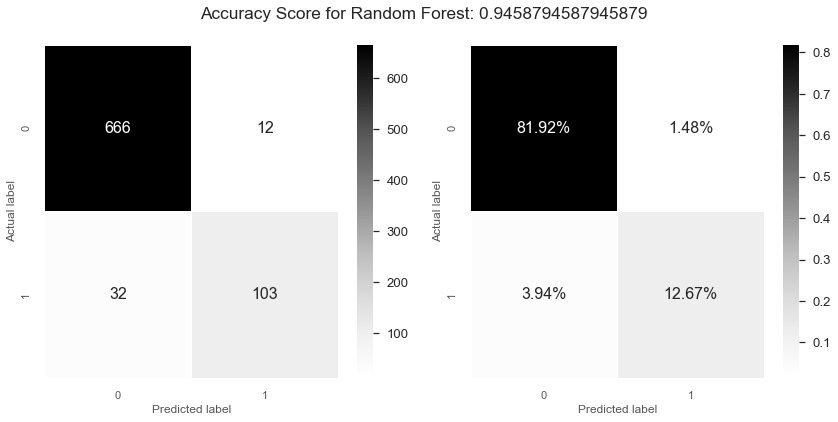

In [138]:
cm = confusion_matrix(y_test, y_pred_rfc)

f, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))
ax = ax.flat
sns.set(font_scale = 1.2)

sns.heatmap(data = cm, linewidths = 0.5, annot = True,  fmt = 'd', cmap = 'Greys', annot_kws = {'size':16}, ax = ax[0])
sns.heatmap(data = cm/np.sum(cm), linewidths = 0.5, annot = True,  fmt = '.2%', cmap = 'Greys', annot_kws = {'size':16}, ax = ax[1])

ax[0].set_ylabel('Actual label')
ax[0].set_xlabel('Predicted label')
ax[1].set_ylabel('Actual label')
ax[1].set_xlabel('Predicted label')

plt.suptitle('Accuracy Score for Random Forest: {0}'.format(rfc.score(X_test_prep, y_test)))
f.tight_layout()
plt.show()

In [139]:
print('F-1 Score : ', (f1_score(y_test, y_pred_rfc)))
print('Precision Score : ', (precision_score(y_test, y_pred_rfc)))
print('Recall Score : ', (recall_score(y_test, y_pred_rfc)))

F-1 Score :  0.824
Precision Score :  0.8956521739130435
Recall Score :  0.762962962962963


In [147]:
print(
    classification_report(
        y_true = y_test,
        y_pred = y_pred_rfc
    )
)

              precision    recall  f1-score   support

           0       0.95      0.98      0.97       678
           1       0.90      0.76      0.82       135

    accuracy                           0.95       813
   macro avg       0.92      0.87      0.90       813
weighted avg       0.94      0.95      0.94       813



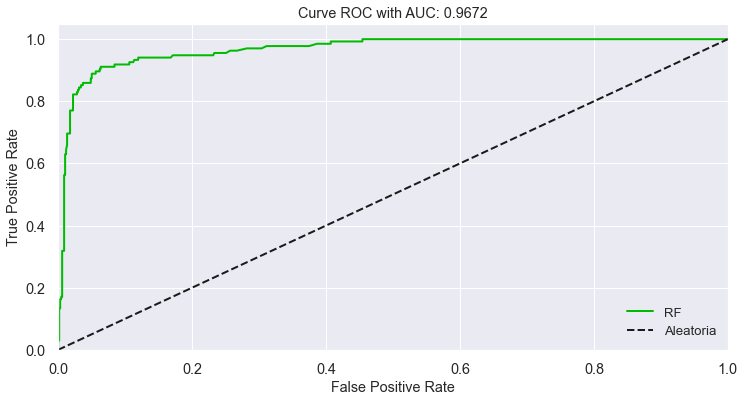

In [140]:
pred_proba_rf = rfc.predict_proba(X_test_prep)

fig, ax = plt.subplots(figsize = (12, 6))

skplt.metrics.plot_roc(y_test, pred_proba_rf, ax = ax)

ax.lines[0].remove()
ax.lines[1].remove()
ax.lines[1].remove()
plt.title('Curve ROC with AUC: {}'.format(round(roc_auc_score(y_test, pred_proba_rf[:,1]),4)))
plt.legend(labels = ['RF', 'Aleatoria']);

## XGBoost

In [393]:
xgb = XGBClassifier(use_label_encoder = False, verbosity = 0, silent = True)

param_grid = {
    'n_estimators': [100, 150, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.015, 0.025, 0.05, 0.1],
    'gamma': [0.7, 0.9, 1, 10],
    'reg_alpha': [0.1, 0.5, 1],
    'n_jobs': [-1],
    'scale_pos_weight': [5]
}


grid_search = GridSearchCV(xgb, param_grid, cv = 5)

grid_search.fit(X_train_prep, y_train,
                early_stopping_rounds = 5,
                eval_set = [(X_test_prep, y_test)],
                eval_metric = 'auc',
                verbose = False)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     enable_categorical=False, gamma=None,
                                     gpu_id=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_delta_step=None,
                                     max_depth=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,...
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, scale_pos_weight=None,
                                     silent=True, subsample=None,
                                     tree_method=None, use_label_encoder=False,
                                     validate_parameters=None, verbosity=0),
             param_grid={'gamma': [0.7, 0.9, 1, 10],
                         'learning_rate': [0.01, 0.015, 0.025, 0.05, 0.1],
                         'max_depth': [3, 5, 7],
                         'n_estimators': [100, 150, 200], 'n_jobs': [-1],
                         'reg_alpha': [0.1, 0.5, 1], 'scale_pos_weight': [5]})

In [394]:
print(grid_search.best_params_)

{'gamma': 0.9, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 150, 'n_jobs': -1, 'reg_alpha': 0.1, 'scale_pos_weight': 5}


In [141]:
xgb = XGBClassifier(gamma = 0.9,
                    learning_rate = 0.1, 
                    max_depth = 7, 
                    n_estimators = 150,
                    reg_alpha = 0.1, 
                    scale_pos_weight = 5,
                    n_jobs = -1,
                    verbosity = 0,
                    silent = True,
                    random_state = 44)

xgb.fit(X_train_prep, y_train, eval_metric = 'auc')

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0.9, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=7, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=150, n_jobs=-1,
              num_parallel_tree=1, predictor='auto', random_state=44,
              reg_alpha=0.1, reg_lambda=1, scale_pos_weight=5, silent=True,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=0)

In [142]:
pred_xgb = xgb.predict(X_test_prep)

In [143]:
print("Accuracy Score :", round(accuracy_score(y_test, pred_xgb)*100 ,2), "%")

Accuracy Score : 94.96 %


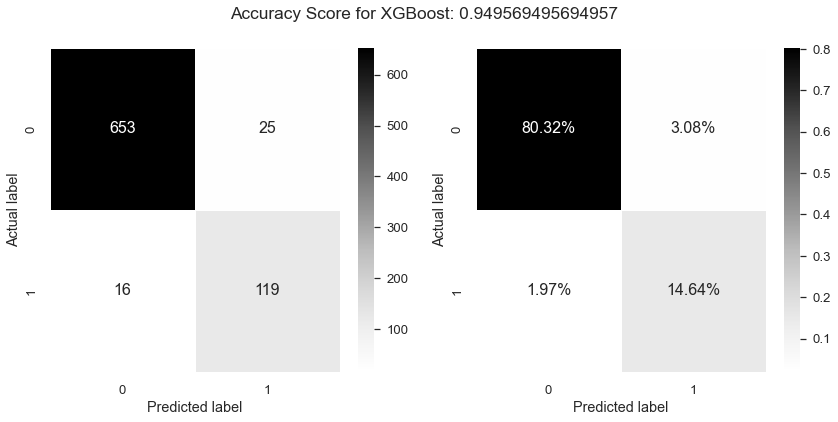

In [144]:
cm_xgb = confusion_matrix(y_test, pred_xgb)

f, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))
ax = ax.flat
sns.set(font_scale = 1.2)

sns.heatmap(data = cm_xgb, linewidths = 0.5, annot = True,  fmt = 'd', cmap = 'Greys', annot_kws = {'size':16}, ax = ax[0])
sns.heatmap(data = cm_xgb/np.sum(cm_xgb), linewidths = 0.5, annot = True,  fmt = '.2%', cmap = 'Greys', annot_kws = {'size':16}, ax = ax[1])

ax[0].set_ylabel('Actual label')
ax[0].set_xlabel('Predicted label')
ax[1].set_ylabel('Actual label')
ax[1].set_xlabel('Predicted label')

plt.suptitle('Accuracy Score for XGBoost: {0}'.format(xgb.score(X_test_prep, y_test)))
f.tight_layout()
plt.show()

In [145]:
print('F-1 Score : ', (f1_score(y_test, pred_xgb)))
print('Precision Score : ', (precision_score(y_test, pred_xgb)))
print('Recall Score : ', (recall_score(y_test, pred_xgb)))

F-1 Score :  0.8530465949820789
Precision Score :  0.8263888888888888
Recall Score :  0.8814814814814815


In [146]:
print(
    classification_report(
        y_true = y_test,
        y_pred = pred_xgb
    )
)

              precision    recall  f1-score   support

           0       0.98      0.96      0.97       678
           1       0.83      0.88      0.85       135

    accuracy                           0.95       813
   macro avg       0.90      0.92      0.91       813
weighted avg       0.95      0.95      0.95       813



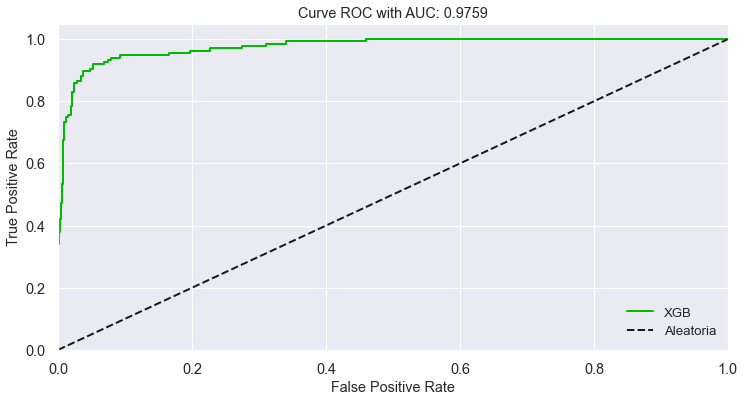

In [147]:
pred_proba_xgb = xgb.predict_proba(X_test_prep)

fig, ax = plt.subplots(figsize = (12, 6))

skplt.metrics.plot_roc(y_test, pred_proba_xgb, ax = ax)

ax.lines[0].remove()
ax.lines[1].remove()
ax.lines[1].remove()
plt.title('Curve ROC with AUC: {}'.format(round(roc_auc_score(y_test, pred_proba_xgb[:,1]),4)))
plt.legend(labels = ['XGB', 'Aleatoria']);

## LGBM

In [161]:
def objective_lgbm(trial):
    
    X_train_prep, X_test_prep, y_train, y_test
    
    param = {
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', low=2.0, high=10.0, step=1.0, log=False),
        'n_estimators': trial.suggest_categorical("n_estimators", [150, 200, 250, 300]),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-3, 10.0),
        'learning_rate': trial.suggest_categorical('learning_rate', [0.01,0.015,0.025,0.05,0.1]),
        'max_depth': trial.suggest_categorical('max_depth', [3,5,7,9,12,15,17,25]),
        'num_leaves' : trial.suggest_int('num_leaves', 20, 100),
        'min_child_samples': trial.suggest_int('min_child_samples', 100, 1000),
        'random_state': 44,
        'n_jobs': 1
    }
    
    model = LGBMClassifier(**param)
    model.fit(X_train_prep, y_train, early_stopping_rounds = 5, eval_set = [(X_test_prep, y_test)], verbose = False)    
    preds = model.predict(X_test_prep)
    
    acc = accuracy_score(y_test, preds)      

    return acc

optuna.logging.set_verbosity(optuna.logging.WARNING)
study = optuna.create_study(direction = 'maximize')
study.optimize(objective_lgbm, n_trials = 50)
params_lgbm = study.best_trial.params

print('Number of finished trials:', len(study.trials))
print('Best trial:', params_lgbm)

Number of finished trials: 50
Best trial: {'scale_pos_weight': 3.0, 'n_estimators': 250, 'reg_lambda': 0.007274558902199078, 'learning_rate': 0.1, 'max_depth': 7, 'num_leaves': 77, 'min_child_samples': 109}


In [163]:
X_train_prep, X_test_prep, y_train, y_test

model = LGBMClassifier(**params_lgbm, random_state = 44, n_jobs = 1)
model.fit(X_train_prep, y_train, early_stopping_rounds = 50, eval_set = [(X_test_prep, y_test)], verbose = False)   
y_pred_lgbm = model.predict(X_test_prep)

print(f"Accuracy: {round(accuracy_score(y_pred_lgbm, y_test), 2)}")
print("="*60)
print(f"Recall: {round(recall_score(y_pred_lgbm,y_test),2)}")
print("="*60)
print(f"Precision: {round(precision_score(y_pred_lgbm,y_test), 2)}")
print("="*60)
print(f"F1: {round(f1_score(y_pred_lgbm,y_test), 2)}")
print("="*60)
print(f"Auc: {round(roc_auc_score(y_pred_lgbm,y_test), 2)}")
print("="*60)
CR = classification_report(y_pred_lgbm,y_test)
CM = confusion_matrix(y_pred_lgbm,y_test)
print(f"Classification Report:\n {CR}")
print("="*60)
print(f"Confusion Matrix: {CM}")
print("="*60)

Accuracy: 0.94
Recall: 0.78
Precision: 0.87
F1: 0.82
Auc: 0.88
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.97      0.96       663
           1       0.87      0.78      0.82       150

    accuracy                           0.94       813
   macro avg       0.91      0.88      0.89       813
weighted avg       0.94      0.94      0.94       813

Confusion Matrix: [[645  18]
 [ 33 117]]


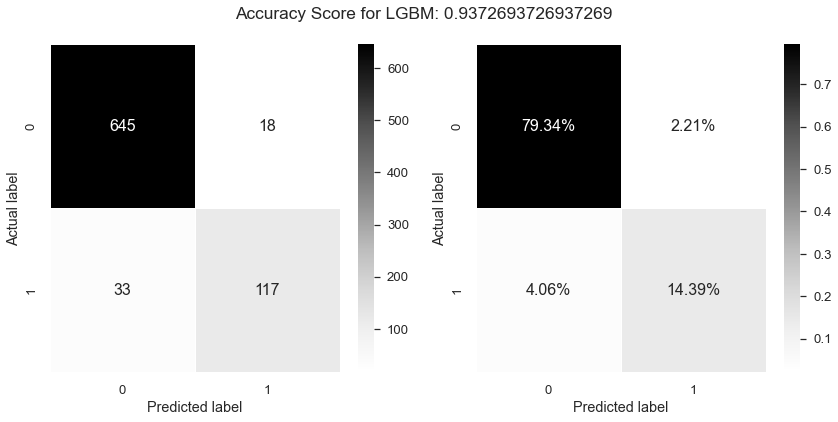

In [164]:
f, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))
ax = ax.flat
sns.set(font_scale = 1.2)

sns.heatmap(data = CM, linewidths = 0.5, annot = True,  fmt = 'd', cmap = 'Greys', annot_kws = {'size':16}, ax = ax[0])
sns.heatmap(data = CM/np.sum(CM), linewidths = 0.5, annot = True,  fmt = '.2%', cmap = 'Greys', annot_kws = {'size':16}, ax = ax[1])

ax[0].set_ylabel('Actual label')
ax[0].set_xlabel('Predicted label')
ax[1].set_ylabel('Actual label')
ax[1].set_xlabel('Predicted label')

plt.suptitle('Accuracy Score for LGBM: {0}'.format(model.score(X_test_prep, y_test)))
f.tight_layout()
plt.show()

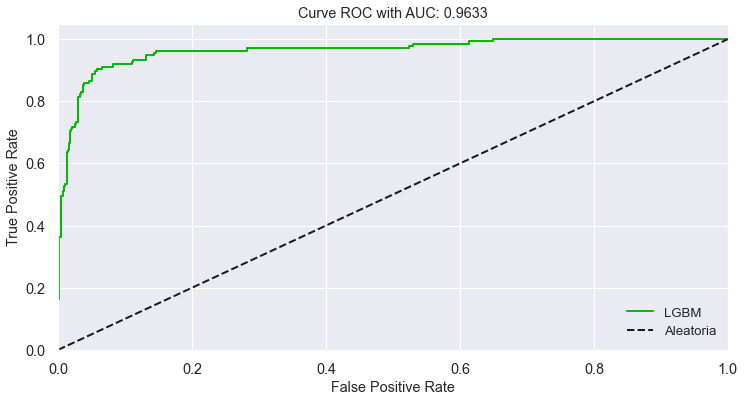

In [165]:
pred_proba_lgbm = model.predict_proba(X_test_prep)

fig, ax = plt.subplots(figsize = (12, 6))

skplt.metrics.plot_roc(y_test, pred_proba_lgbm, ax = ax)

ax.lines[0].remove()
ax.lines[1].remove()
ax.lines[1].remove()
plt.title('Curve ROC with AUC: {}'.format(round(roc_auc_score(y_test, pred_proba_lgbm[:,1]),4)))
plt.legend(labels = ['LGBM', 'Aleatoria']);

# Importancia de las variables

Ahora, veamos la importancia que tiene cada variable en este modelo, para darnos una idea de cuáles son las variables que más aportan a la hora de predecir el abandono de los clientes.

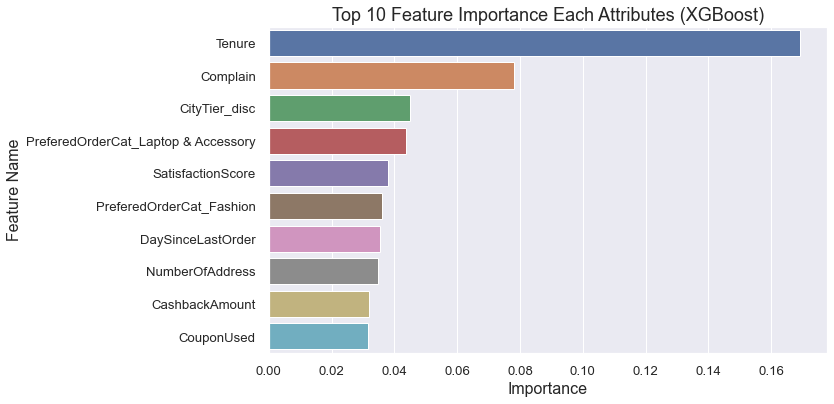

In [166]:
imp_df = pd.DataFrame({
    "Feature Name": X_train_prep.columns,
    "Importance": xgb.feature_importances_
})

f_imp = imp_df.sort_values(by = "Importance", ascending = False)

f_imp2 = f_imp.head(10)

plt.figure(figsize = (10, 6))

sns.barplot(data = f_imp2, x = 'Importance', y = 'Feature Name')

plt.title('Top 10 Feature Importance Each Attributes (XGBoost)', fontsize = 18)
plt.xlabel ('Importance', fontsize = 16)
plt.ylabel ('Feature Name', fontsize = 16)
plt.show()

In [167]:
f_imp2

,Feature Name,Importance
20,Tenure,0.169254
29,Complain,0.077980
17,CityTier_disc,0.045061
10,PreferedOrderCat_Laptop & Accessory,0.043666
22,SatisfactionScore,0.037829
9,PreferedOrderCat_Fashion,0.036141
27,DaySinceLastOrder,0.035522
23,NumberOfAddress,0.034695
28,CashbackAmount,0.031940
25,CouponUsed,0.031536


La antigüedad, las quejas del último mes y el nivel de Ciudad son las tres variables que más importancia tienen para el modelo final.

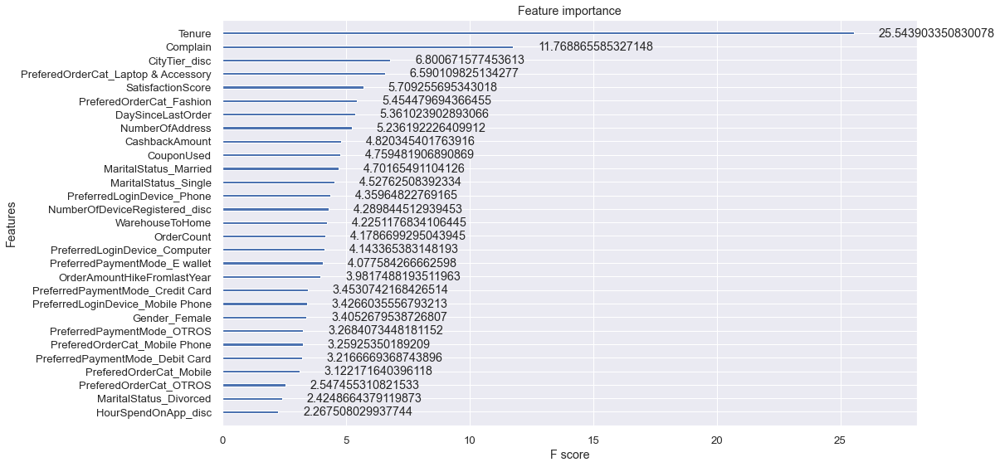

In [168]:
fig, ax = plt.subplots(figsize = (15, 9))

plot_importance(xgb, importance_type = "gain", ax = ax)
plt.show()

<div class=text-justify>
    Existe un método llamado <i>Permutation Importance</i>, que calcula la pérdida de la capacidad predictiva de cada variable al permutar (mezclar aleatoriamente) los valores de cada variable a contrastar. Por lo tanto, mide cuanto ha perdido de capacidad predictiva el modelo en cuestión por haber permutado esa variable y de esa forma estima cómo de importante es. En otras palabras, agarra una variable predictora y mezcla sus valores y si existe un patrón en ella que se relaciona con la variable a predecir pues al hacer esa permutación o mezcla ese patrón se romperá y el modelo perderá capacidad predictiva, y así continua con cada variable independiente. Lógicamente, entre mayor sea la pérdida más importante será esa variable.
</div>

In [169]:
import warnings

warnings.filterwarnings(action = 'ignore', message = r'.*Use subset.*of np.ndarray is not recommended')

permutation = permutation_importance(estimator = xgb,
                                     X = X_train_prep,
                                     y = y_train,
                                     scoring = 'roc_auc',
                                     n_repeats = 5,
                                     n_jobs = -1)

In [170]:
def formato(var):
    x = (var)
    return('%.06f' %x)

In [171]:
ranking_pi = pd.DataFrame({'variable':X_train_prep.columns,
                           'importancia':permutation.importances_mean}).sort_values(by = 'importancia',
                                                                                    ascending = False)
ranking_pi['ranking'] = np.arange(0, ranking_pi.shape[0])
ranking_pi['importancia'] = ranking_pi.importancia.apply(formato).astype(float)

ranking_pi.head(10)

,variable,importancia,ranking
20,Tenure,0.172800,0
29,Complain,0.035451,1
28,CashbackAmount,0.019174,2
23,NumberOfAddress,0.013755,3
22,SatisfactionScore,0.005177,4
21,WarehouseToHome,0.002530,5
27,DaySinceLastOrder,0.001932,6
19,NumberOfDeviceRegistered_disc,0.001534,7
16,MaritalStatus_Single,0.001214,8
24,OrderAmountHikeFromlastYear,0.000750,9


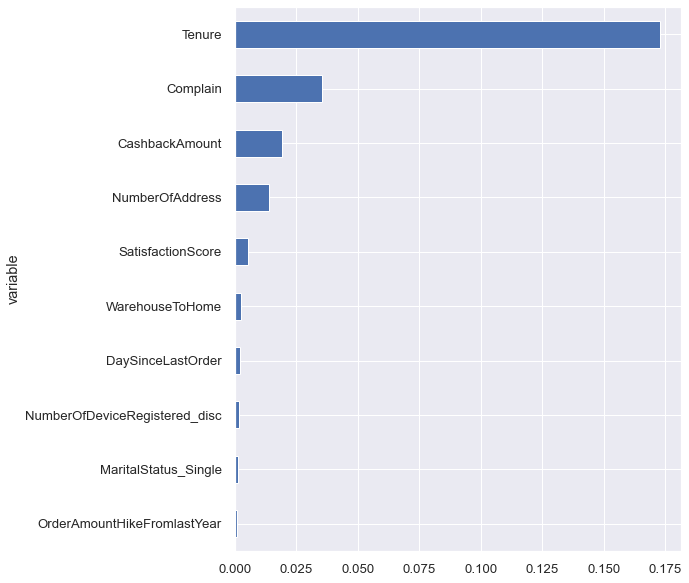

In [172]:
ranking_pi.set_index('variable').importancia.sort_values().tail(10).plot.barh(figsize = (8, 10));

Con este método la variable dominante es `Tenure` seguida de `Complain` y en tercer lugar ya no aparece `CityTier` sino `CashbackAmount`.

# Punto de corte (visión de negocio)

Hay que recordar que el objetivo del proyecto es identificar con la mayor exactitud posible a los clientes con la probabilidad más alta de abandonar la empresa, por lo que, nos interesa mejorar la métrica del Recall. **El modelo que arrojó el mejor Recall fue XGBoost con 88.14%.**

<div class=text-justify>
Al modelo seleccionado todavía se le puede modificar el umbral de corte para mejorar el recall. Hay que recordar que los modelos de clasificación manejan un umbral de 0.5, o sea, probabilidades mayores a ese corte el algoritmo los clasifica como 1 y 0 en otro caso. Esta decisión automática es válida cuando la variable target está balanceada, mismo número de casos 1 y 0, sin embargo, en este proyecto lo anterior no se da. Para darnos una idea de cuál es el punto de corte óptimo se genera la gráfica de <b>precision-recall</b>, que muestra todas las combinaciones del umbral y los diferentes valores de esas métricas.
</div>

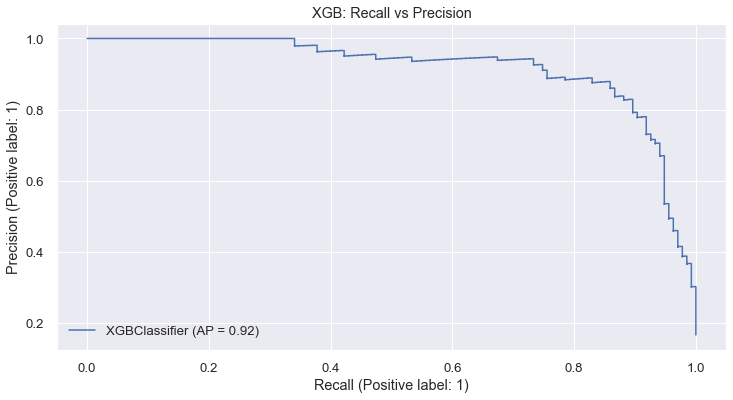

In [173]:
fig, ax = plt.subplots(figsize = (12, 6))

PrecisionRecallDisplay.from_estimator(xgb, X_test_prep, y_test, ax = ax)
plt.title('XGB: Recall vs Precision');

En la gráfica anterior, se muestra la relación entre `Recall` y `Precision`. La desventaja de este gráfico es que no podemos determinar cúal es el punto óptimo. Hay que utilizar la función `precision_recall_curve` para obtenerlo. Además, se creará una función que permita introducir un umbral de corte y que muestre las métricas anteriores para ver las combinaciones arrojadas.

In [174]:
def metricas(real, scoring, umbral):
    
    scoring = scoring[:,1]
    predicho = np.where(scoring > umbral, 1, 0)
    conf = confusion_matrix(real, predicho)
    tn, fp, fn, tp = conf.ravel()
    
    total_casos = real.shape[0]
    
    accuracy = (tn + tp) / total_casos
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    F1 = 2 * (precision * recall) / (precision + recall)
    
    print('\nMatriz de confusión\n', pd.DataFrame(conf))
    print('\naccuracy', round(accuracy, 3))
    print('\nprecision', round(precision, 3))
    print('\nrecall', round(recall, 3))
    print('\nF1', round(F1, 3))

Ya con la función creada, se introduce el corte de 0.5, para comprobar que son los mismos resultados que arrojó la matriz de confusión de xgboost.

In [175]:
metricas(real = y_test, scoring = pred_proba_xgb, umbral = 0.5)


Matriz de confusión
      0    1
0  653   25
1   16  119

accuracy 0.95

precision 0.826

recall 0.881

F1 0.853


Los resultados son los mismos que los generados automáticamente por sklearn. Ahora, se generan las combinaciones para los distintos puntos de corte y se obtiene el punto óptimo.

In [176]:
precision, recall, thresholds = precision_recall_curve(y_test.to_numpy(), pred_proba_xgb[:,1])
f1_scores = 2 * recall * precision / (recall + precision)
best_thresh = thresholds[np.argmax(f1_scores)]

In [177]:
print('Corte óptimo:', best_thresh)

Corte óptimo: 0.62844044


Un gráfico que sí muestra el punto de corte óptimo se genera con la función `discrimination_threshold`, que viene en un paquete externo a sklearn.

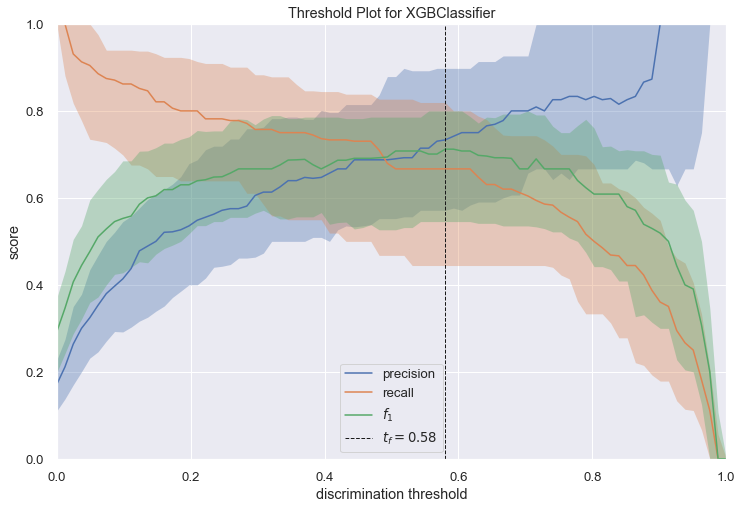

In [178]:
plt.figure(figsize = (12, 8))

visualizer = DiscriminationThreshold(xgb, exclude = 'queue_rate', is_fitted = True, random_state = 123)
visualizer.fit(X_test_prep, y_test)
visualizer.show();

De acuerdo con la gráfica anterior, el punto de corte óptimo está entorno al 0.58, con él se maximizan tanto el recall como el precision, sin embargo, ese no es el que maximiza el objetivo que buscamos.

In [179]:
metricas(real = y_test, scoring = pred_proba_xgb, umbral = 0.58)


Matriz de confusión
      0    1
0  659   19
1   19  116

accuracy 0.953

precision 0.859

recall 0.859

F1 0.859


<div class=text-justify>
Para encontrar el corte óptimo que maximiza el recall vamos a auxiliarnos en una matriz de impacto. Hay que asignar costos a la matriz de confusión. Vamos a suponer que el costo por cometer un falso negativo es de -2 y el costo de cometer un falso positivo es de -5. Le damos más peso a los primeros porque interesa mejorar el recall. Recordar que un falso negativo significa que el modelo predice que un cliente no abandona y la realidad es que sí se va.
</div>

In [180]:
def max_roi(real, scoring, salida = 'grafico'):
    
    #DEFINIMOS LA MATRIZ DE IMPACTO
    ITN = 0
    IFP = -5
    IFN = -2
    ITP = 10
    
    #DEFINIMOS LA FUNCION DEL VALOR ESPERADO
    def valor_esperado(matriz_conf):
        TN, FP, FN, TP = conf.ravel()
        VE = (TN * ITN) + (FP * IFP) + (FN * IFN) + (TP * ITP)
        return(VE)
    
    #CREAMOS UNA LISTA PARA EL VALOR ESPERADO
    ve_list = []
    
    #ITERAMOS CADA PUNTO DE CORTE Y RECOGEMOS SU VE
    for umbral in np.arange(0, 1, 0.15):
        predicho = np.where(scoring > umbral,1,0) 
        conf = confusion_matrix(real,predicho)
        ve_temp = valor_esperado(conf)
        ve_list.append(tuple([umbral,ve_temp]))
        
    #DEVUELVE EL RESULTADO COMO TGRAFICO O COMO EL UMBRAL ÓPTIMO
    df_temp = pd.DataFrame(ve_list, columns = ['umbral', 'valor_esperado'])
    if salida == 'grafico':
        solo_ve_positivo = df_temp[df_temp.valor_esperado > 0]
        plt.figure(figsize = (12,6))
        sns.lineplot(data = solo_ve_positivo, x = 'umbral', y = 'valor_esperado')
        plt.xticks(solo_ve_positivo.umbral, fontsize = 14)
        plt.yticks(solo_ve_positivo.valor_esperado, fontsize = 12);        
    else:    
        return(df_temp.iloc[df_temp.valor_esperado.idxmax(),0])

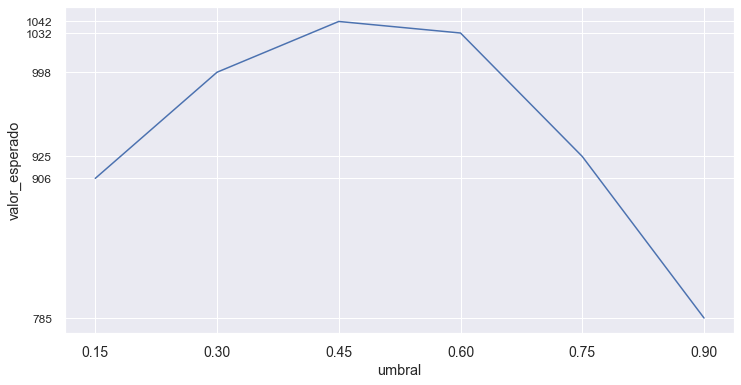

In [181]:
max_roi(real = y_test, scoring = pred_proba_xgb[:,1])

In [182]:
max_roi(real = y_test, scoring = pred_proba_xgb[:,1], salida = 'automatico')

0.44999999999999996

Al parecer esta función obtuvo un valor óptimo de 0.45. Veamos los resultados aplicando este nivel en la función creada anteriormente.

In [183]:
metricas(real = y_test, scoring = pred_proba_xgb, umbral = 0.45)


Matriz de confusión
      0    1
0  650   28
1   14  121

accuracy 0.948

precision 0.812

recall 0.896

F1 0.852


<div class=text-justify>
Vemos que mejoró un poco el recall, lo cual era de esperarse al ver la gráfica de Threshold, al bajar el corte disminuye el recall pero aumenta el precision y viceversa. Por lo anterior, siempre hay que analizar bien el objetivo buscado, identificar qué es más crítico: minimizar los falsos negativos (aumentar el recall) o minimizar los falsos positivos (aumentar el precision). En este ejemplo, como la variación es muy poca entre las diferentes estratégias de optimización, nos quedamos con el resultado que arrojó el modelo xgboost.
</div>

# Interpretación de los resultados

<div class=text-justify>
Una de las desventajas de este tipo de algoritmos es que son "cajas negras", debido a que es muy complicado poder interpretar los resultados generados, ya que se llegan a generar cientos de árboles. Para resolver esta cuestión se han creado algnos paquetes que tratan de darle interpretabilidad a algunos modelos. En este proyecto se usará el paquete <i>shap</i>.
</div>

In [194]:
import shap
shap.initjs()

In [195]:
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X_train_prep)

Se tomarán como ejemplo 2 casos, uno que en realidad abandonó y otro que no abandonó

* 115 (Churn = 1)
* 155 (Churn = 0)

In [196]:
X_test_prep.iloc[[115]]

,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_OTROS,Gender_Female,Gender_Male,PreferedOrderCat_Fashion,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_OTROS,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,CityTier_disc,HourSpendOnApp_disc,NumberOfDeviceRegistered_disc,Tenure,WarehouseToHome,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Complain
115,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.5,0.666667,0.0,0.806452,1.0,0.1,0.076923,0.083333,0.0,0.5,0.576154,0


In [197]:
y_test.iloc[115]

1

In [198]:
shap.force_plot(explainer.expected_value, explainer.shap_values(X_test_prep.iloc[[115]]), X_test_prep.iloc[115])

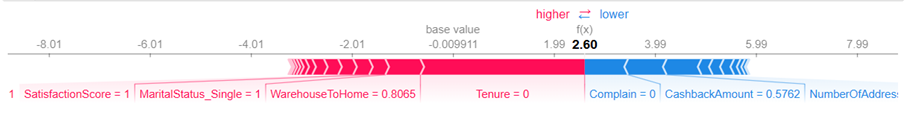

En la gráfica anterior el dato de **-0.009911** es la linea base que eligió este algoritmo para comenzar. Ese valor es la puntuación bruta del modelo (en el caso de xgboost, la puntuación bruta de probabilidades logarítmicas: `log odds`), antes de la función logística (para clasificar).

Para convertirla a probabilidad se crea una función sigmoide que pase ese valor bruto a probabilidad.

In [199]:
import math

def sigmoid(x):
    return 1/(1+math.exp(-x))

In [200]:
print('La probabilidad inicial es:',sigmoid(-0.00911))

La probabilidad inicial es: 0.4977225157510782


Ese dato de 0.4977 es la linea base convertida a probabilidad, en ese nivel empieza el algoritmo a mover el score según el peso de cada variable, ya sea en dirección negativa o positiva.

Y la probabilidad final después de recorrer todas las variables es:

In [201]:
print('La probabilidad final es:',sigmoid(2.60))

La probabilidad final es: 0.9308615796566533


Se comprueba la probabilidad final calculandola con el método `predict_proba`

In [203]:
xgb.predict_proba(X_test_prep.iloc[[115]])[:,1]

array([0.9307892], dtype=float32)

<div class=text-justify>
La explicación de esa gráfica se traduce como sigue: partiendo de una probabilidad de 0.49 algunas de las variables como SatisfactionScore, MaritalStatus, WarehouseToHome y Tenure empujan el score final hacia la clasificación de que la observación en cuestión (115) sea clasificada como 1 (abandono), por el contrario, algunas de las variables como Complain, CashbackAmount y NumberOfAddress empujan el score hacia la clasificacion 0 (no abandono). 
</div>

Con apoyo de la gráfica `waterfall_plot` se ilustra mejor este "jaloneo" de las variables.

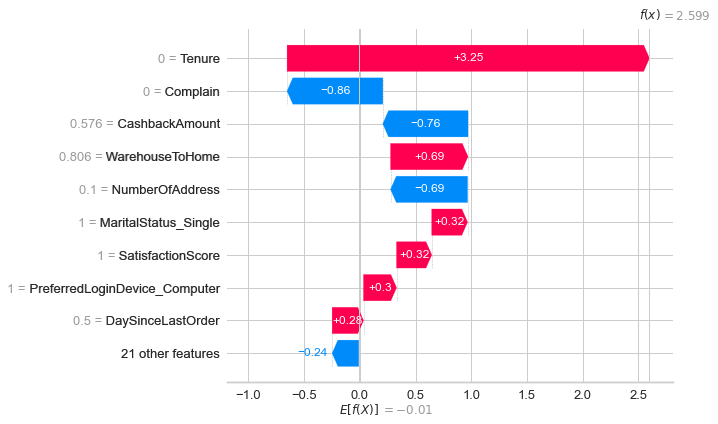

In [219]:
from shap import Explainer, Explanation
from shap import waterfall_plot

explainer = Explainer(xgb)
sv = explainer(X_test_prep.to_numpy())

exp = Explanation(sv, sv.base_values, X_test_prep.to_numpy(), feature_names = X_test_prep.columns.to_list())

idx = 115 # datapoint to explain
waterfall_plot(exp[idx])

Como las variables estan codificadas es difícil saber su magnitud, por lo que, es necesario volver al conjunto de datos original (para la observación en cuestión).

In [222]:
X_test.iloc[[115]].T.rename(columns = {2866:'value'})

,value
Tenure,0.0
PreferredLoginDevice,Computer
CityTier,1
WarehouseToHome,30.0
PreferredPaymentMode,COD
Gender,Male
HourSpendOnApp,3.0
NumberOfDeviceRegistered,4
PreferedOrderCat,Fashion
SatisfactionScore,5


La explicación más entendible y personalizada para ese cliente (Gender = Male) en la posición `id 115` sería:


Algunas variables con sus valores que influyen para un score cercano a 1 (abandono) son:

* SatisfactionScore = 5
* MaritalStatus = Single
* WarehouseToHome = 30 
* Tenure = 0

Algunas variables con sus valores que influyen para un score cercano a 0 (no abandono) son:

* Complain = 0
* CashbackAmount = 187.25
* NumberOfAddress = 2

Veamos ahora el caso contrario, donde el cliente no abandona (Churn = 0). El procedimiento es exactamente el mismo

Se verifican los datos del registro

In [204]:
X_test_prep.iloc[[155]]

,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_OTROS,Gender_Female,Gender_Male,PreferedOrderCat_Fashion,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_OTROS,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,CityTier_disc,HourSpendOnApp_disc,NumberOfDeviceRegistered_disc,Tenure,WarehouseToHome,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Complain
155,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.666667,0.967742,0.322581,1.0,0.5,0.615385,0.166667,0.2,0.166667,0.515769,1


Se checa su valor real de la variable a precedir

In [225]:
y_test.iloc[155]

0

Se crea la gráfica del explainer

In [206]:
shap.force_plot(explainer.expected_value, explainer.shap_values(X_test_prep.iloc[[155]]), X_test_prep.iloc[155])

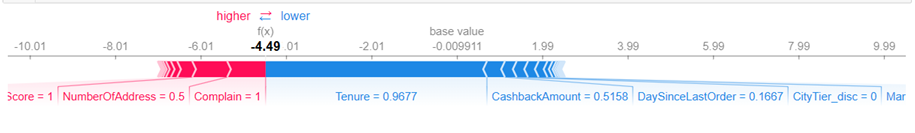

In [207]:
print('La probabilidad inicial es:',sigmoid(-0.00911))

La probabilidad inicial es: 0.4977225157510782


In [208]:
print('La probabilidad final es:',sigmoid(-4.49))

La probabilidad final es: 0.011096137997457565


Se comprueba con el valor real de predicción

In [209]:
xgb.predict_proba(X_test_prep.iloc[[155]])[:,1]

array([0.01113224], dtype=float32)

Se crea la gráfica waterfall_plot

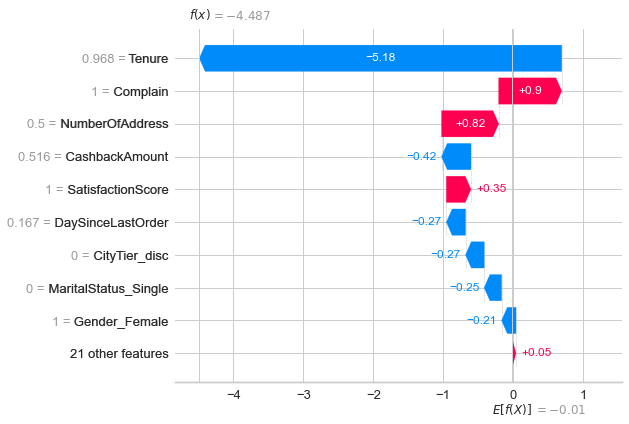

In [223]:
idx = 155 # datapoint to explain
waterfall_plot(exp[idx])

Se revisan los datos originales para la interpretación

In [226]:
X_test.iloc[[155]].T.rename(columns = {3409:'value'})

,value
Tenure,30.0
PreferredLoginDevice,Mobile Phone
CityTier,1
WarehouseToHome,15.0
PreferredPaymentMode,Debit Card
Gender,Female
HourSpendOnApp,4.0
NumberOfDeviceRegistered,4
PreferedOrderCat,Mobile Phone
SatisfactionScore,5


Veamos otro tipo de gráfica que muestra la importancia de cada variable con este paquete.

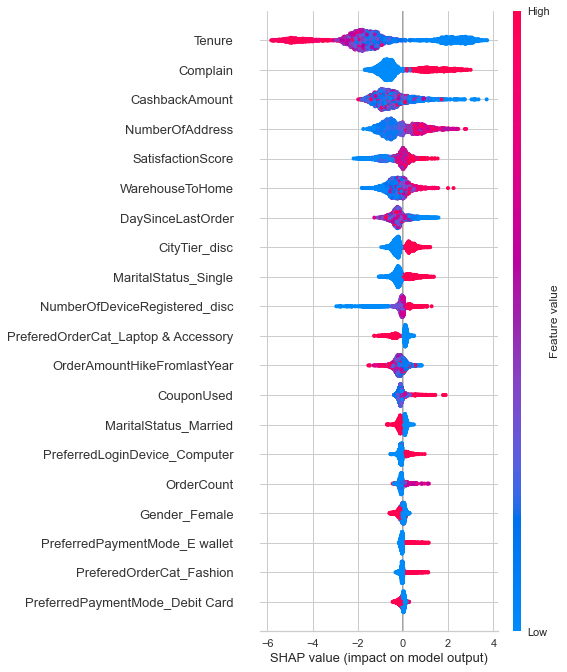

In [211]:
shap.summary_plot(shap_values, X_train_prep, show = False)

Entre más ancho o más amplio son los puntos más importancia tiene esa variable. El signo indica hacia donde ha empujado la prediccion, en una direccion o en otra. El color es el valor de la propia variable: valor bajo (azul) es tener poca antigüedad y valor alto (rojo) es tener mucha antigüedad. Complain valor bajo (azul) indica que no hubo queja y valor alto (rojo) es que si hubo queja.

<div class=text-justify>
En esta gráfica la antigüedad (Tenure) tiene el máximo impacto en el score, tal vez los clientes con más años ya están cansados del servicio y deciden abandonar. También, los clientes que presentaron alguna queja en el último mes están más propensos a irse. Las devoluciones bajas, también tuvieron un impacto para que abandonaran los clientes. Las demás variables tienen explicación similar.
</div>

Finalmente, veamos cómo han impactado las variables en todo el dataset. Es como poner la primer gráfica inicial en vertical para cada observacion y apilarlas como columnas:

In [212]:
shap.force_plot(explainer.expected_value, shap_values, X_train_prep)

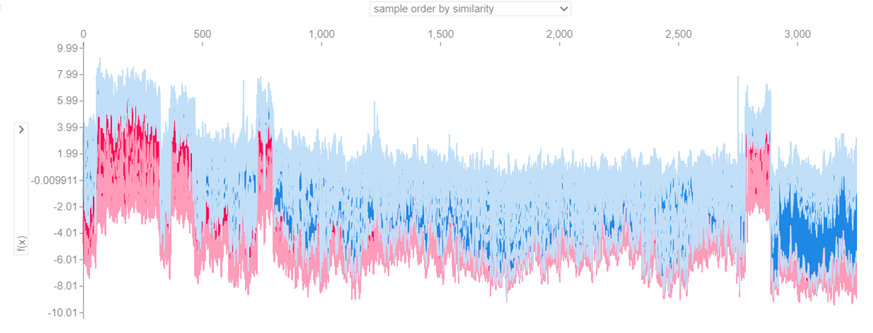

<div class=text-justify>
La gráfica anterior, es muy densa porque representa todas las observaciones con sus respectivos valores de cada variable. Se parecia como la linea base de la que parte este algoritmo es -0.009911, como se vio en los dos ejemplos anteriores y de ahí en adelante empieza el "jaloneo" del scoring. Predomina el color azul, que representa todas las observaciones clasificadas como 0 (que son la mayoría) y la región en color rojo son las observaciones clasificadas como 1.
</div>

# Evaluación final

<div class=text-justify>
    Ya se tiene el modelo final, un <b>xgboost</b>, con los hiperparámetros calibrados, por lo que, ya solo falta volver a entrenarlo con el dataset completo, o sea, se unirán la parte de train y test, así como también la variable target. Aquí es donde se usará el dataset que se reservó desde el inicio de las divisiones, el de validación. Ya no es necesario hacerle ninguna modificación, porque se fueron haciendo junto con los datasets de train y test. En proyectos reales esta parte de validación se configura al final, ya que se supone que los datos nuevos llegan después de entrenado el modelo y, lógicamente, también después de preparar la data para dicho entrenamiento.
</div>

Variables predictoras:

In [184]:
X_final = pd.concat(objs = [X_train_prep, X_test_prep], axis = 0)
X_final

,PreferredLoginDevice_Computer,PreferredLoginDevice_Mobile Phone,PreferredLoginDevice_Phone,PreferredPaymentMode_Credit Card,PreferredPaymentMode_Debit Card,PreferredPaymentMode_E wallet,PreferredPaymentMode_OTROS,Gender_Female,Gender_Male,PreferedOrderCat_Fashion,PreferedOrderCat_Laptop & Accessory,PreferedOrderCat_Mobile,PreferedOrderCat_Mobile Phone,PreferedOrderCat_OTROS,MaritalStatus_Divorced,MaritalStatus_Married,MaritalStatus_Single,CityTier_disc,HourSpendOnApp_disc,NumberOfDeviceRegistered_disc,Tenure,WarehouseToHome,SatisfactionScore,NumberOfAddress,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,Complain
0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.5,0.666667,0.096774,0.387097,0.50,0.2,0.076923,0.083333,0.0,0.055556,0.465769,0
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.5,1.000000,0.032258,0.161290,0.00,0.1,0.076923,0.083333,0.0,0.055556,0.472308,1
2,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.666667,0.645161,0.290323,0.50,0.3,0.307692,0.166667,0.0,0.055556,0.546538,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
810,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.5,0.666667,0.032258,0.483871,0.75,0.6,0.076923,0.166667,0.0,0.055556,0.561923,0
811,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.666667,0.032258,0.129032,0.00,0.7,0.230769,0.250000,0.2,0.166667,0.499231,1
812,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.666667,0.580645,0.806452,0.75,0.5,0.153846,0.083333,0.0,0.166667,0.447308,0


Variable target:

In [185]:
y_final = pd.concat(objs = [y_train, y_test], axis = 0)
y_final

3731    0
5196    1
4769    0
       ..
5362    1
4156    1
4533    0
Name: Churn, Length: 4065, dtype: int8

Se crea y entrena el modelo:

In [186]:
xgb_final = XGBClassifier(gamma = 0.9,
                    learning_rate = 0.1, 
                    max_depth = 7, 
                    n_estimators = 150,
                    reg_alpha = 0.1, 
                    scale_pos_weight = 5,
                    n_jobs = -1,
                    verbosity = 0,
                    silent = True,
                    random_state = 44)

xgb_final.fit(X_final, y_final, eval_metric = 'auc')

pred_xgb_final = xgb_final.predict(X_val_prep)

Calcula el Accuracy:

In [187]:
print("Accuracy Score :", round(accuracy_score(y_val, pred_xgb_final)*100 ,2), "%")

Accuracy Score : 95.94 %


Matriz de confusión:

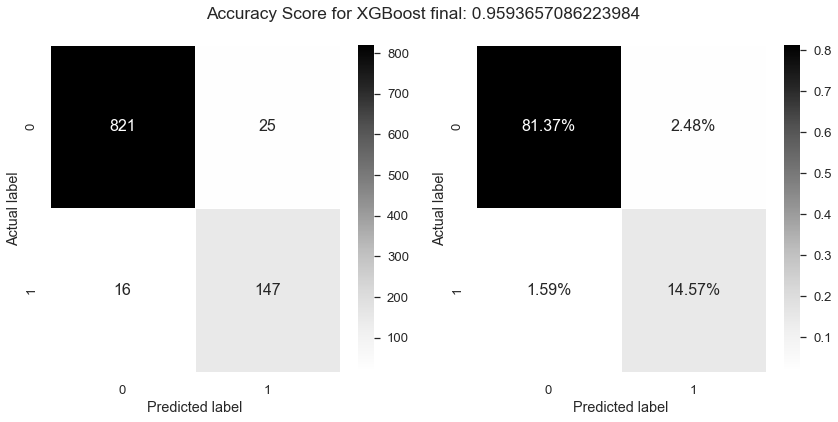

In [188]:
cm_xgb_final = confusion_matrix(y_val, pred_xgb_final)

f, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))
ax = ax.flat
sns.set(font_scale = 1.2)

sns.heatmap(data = cm_xgb_final, linewidths = 0.5, annot = True,  fmt = 'd', cmap = 'Greys', annot_kws = {'size':16}, ax = ax[0])
sns.heatmap(data = cm_xgb_final/np.sum(cm_xgb_final), linewidths = 0.5, annot = True,  fmt = '.2%', cmap = 'Greys', annot_kws = {'size':16}, ax = ax[1])

ax[0].set_ylabel('Actual label')
ax[0].set_xlabel('Predicted label')
ax[1].set_ylabel('Actual label')
ax[1].set_xlabel('Predicted label')

plt.suptitle('Accuracy Score for XGBoost final: {0}'.format(xgb_final.score(X_val_prep, y_val)))
f.tight_layout()
plt.show()

Métricas de evaluación:

In [189]:
print('F-1 Score : ', (f1_score(y_val, pred_xgb_final)))
print('Precision Score : ', (precision_score(y_val, pred_xgb_final)))
print('Recall Score : ', (recall_score(y_val, pred_xgb_final)))

F-1 Score :  0.8776119402985075
Precision Score :  0.8546511627906976
Recall Score :  0.901840490797546


Se crea la curva ROC:

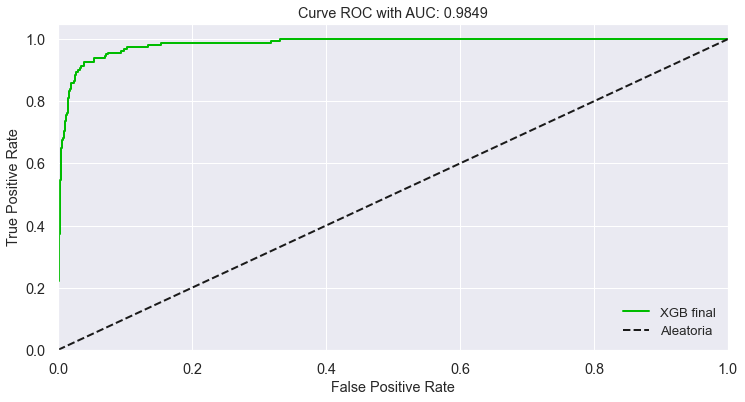

In [190]:
pred_proba_xgb_final = xgb_final.predict_proba(X_val_prep)

fig, ax = plt.subplots(figsize = (12, 6))

skplt.metrics.plot_roc(y_val, pred_proba_xgb_final, ax = ax)

ax.lines[0].remove()
ax.lines[1].remove()
ax.lines[1].remove()
plt.title('Curve ROC with AUC: {}'.format(round(roc_auc_score(y_val, pred_proba_xgb_final[:,1]),4)))
plt.legend(labels = ['XGB final', 'Aleatoria']);

Este modelo final obtuvo mejor desempeño, pues todas las métricas mejoraron. Ya solo se genera un dataframe con los resultados de la predicción.

# Resultados

In [191]:
temp = pd.DataFrame(xgb_final.predict(X_val_prep), index = X_val.index, columns = ['Prediccion']).reset_index()
temp

,index,Prediccion
0,6,1
1,21,0
2,37,1
...,...,...
1006,5613,0
1007,5618,0
1008,5624,0


In [192]:
print("Total de clientes con alto riesgo de abandono:", temp.Prediccion.value_counts().values[1])

Total de clientes con alto riesgo de abandono: 172


In [193]:
temp = temp.loc[temp['Prediccion'] == 1]
temp

,index,Prediccion
0,6,1
2,37,1
4,44,1
...,...,...
957,5363,1
980,5494,1
989,5542,1


Aquí es donde se utiliza la copia de respaldo que se genero desde el inicio del proyecto, para cruzar los índices y obtener los identificadores de cada cliente.

In [194]:
riesgo_abandono = pd.merge(left = temp,
                           right = df_respaldo,
                           how = 'left',
                           on = 'index')

Se obtienen los ids de los 172 cientes a los cuales hay que lanzarles la promoción para retenerlos.

In [195]:
riesgo_abandono.drop(columns = ['index','Prediccion'], inplace = True)
riesgo_abandono

,CustomerID
0,50040
1,50258
2,50316
...,...
169,55219
170,55416
171,55494


In [196]:
import session_info

session_info.show(html = False)

-----
feature_engine      1.4.1
ipykernel           6.15.0
lightgbm            3.3.2
matplotlib          3.5.2
missingno           0.5.2
numpy               1.22.3
optuna              3.3.0
pandas              1.5.3
scikitplot          0.3.7
scipy               1.7.3
seaborn             0.11.2
session_info        1.0.0
sklearn             1.1.1
xgboost             1.5.2
yellowbrick         1.5
-----
IPython             8.4.0
jupyter_client      7.3.4
jupyter_core        4.10.0
notebook            6.4.12
-----
Python 3.10.4 | packaged by conda-forge | (main, Mar 30 2022, 08:38:02) [MSC v.1916 64 bit (AMD64)]
Windows-10-10.0.18363-SP0
-----
Session information updated at 2023-09-04 12:30
